In [1]:
import sys
import numpy as np
import pandas as pd
import seaborn as sns
import re

import matplotlib as mpl
%matplotlib inline
import matplotlib.pyplot as plt

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243 entries, 0 to 242
Data columns (total 16 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   country                           243 non-null    object 
 1   population                        243 non-null    object 
 2   births                            243 non-null    float64
 3   deaths                            243 non-null    float64
 4   migration_rate                    243 non-null    object 
 5   population_mid2030                243 non-null    object 
 6   population_mid2050                243 non-null    object 
 7   infant_mortality_rate             243 non-null    object 
 8   fertility_rate                    243 non-null    float64
 9   population_age_lessthan15         243 non-null    float64
 10  population_age_over65             243 non-null    float64
 11  gni                               243 non-null    object 
 12  percent_

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\1755616553.py:9: FutureWarning: The default value of regex will change from True to False in a future version.
  df_2015[col] = df_2015[col].str.replace(',', '').str.replace(r'[\(\)]', '').str.strip()
C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\1755616553.py:14: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix_2015 = df_2015.corr().round(2)


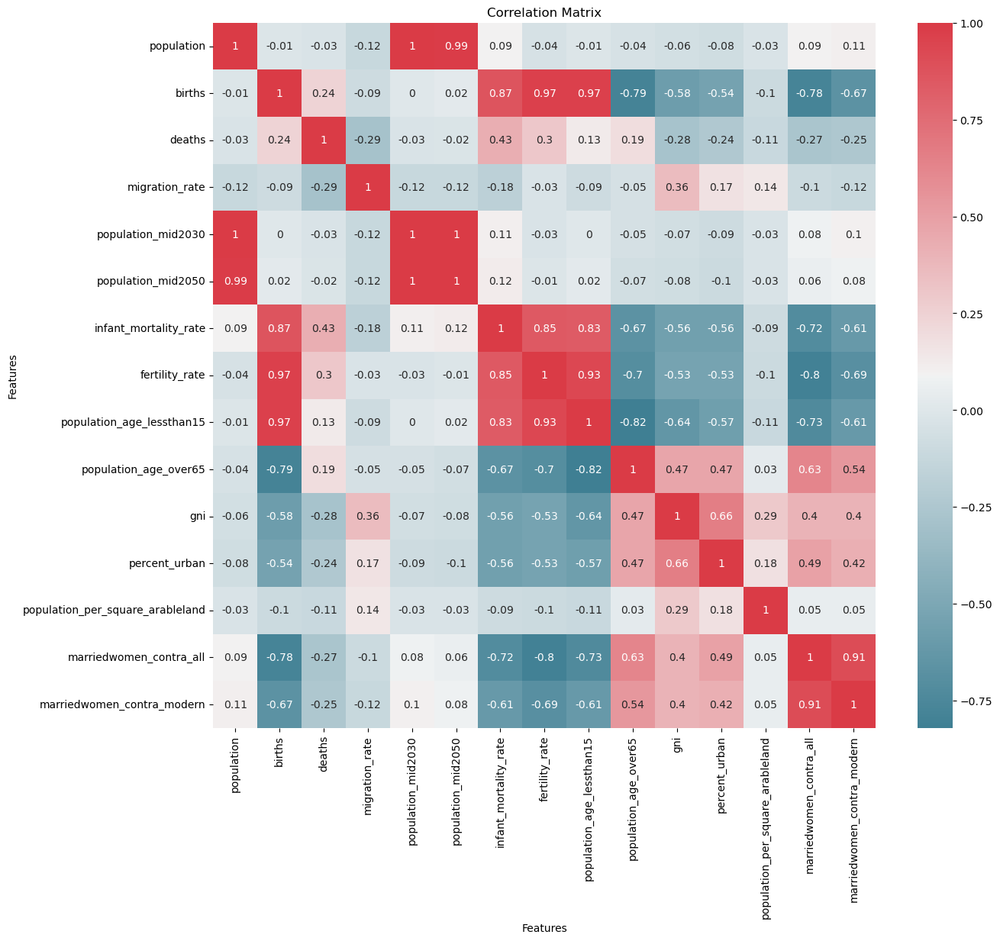

,country,population,births,deaths,migration_rate,population_mid2030,population_mid2050,infant_mortality_rate,fertility_rate,population_age_lessthan15,population_age_over65,gni,percent_urban,population_per_square_arableland,marriedwomen_contra_all,marriedwomen_contra_modern
0,WORLD,7336.0,20.0,8.0,NaN,8505.0,9804.0,37.0,2.5,26.0,8.0,15030.0,53.0,523.0,62.0,56.0
1,MORE DEVELOPED,1254.0,11.0,10.0,2.0,1295.0,1310.0,5.0,1.7,16.0,17.0,39020.0,77.0,238.0,67.0,59.0
2,LESS DEVELOPED,6082.0,22.0,7.0,1.0,7210.0,8495.0,40.0,2.6,28.0,6.0,9870.0,48.0,696.0,61.0,55.0
3,LESS DEVELOPED (Excl. China),4702.0,24.0,7.0,NaN,5779.0,7120.0,44.0,3.0,32.0,5.0,8740.0,46.0,612.0,54.0,46.0
4,LEAST DEVELOPED,938.0,34.0,9.0,1.0,1300.0,1887.0,62.0,4.3,40.0,4.0,2270.0,29.0,521.0,37.0,32.0


In [2]:
df_2015 = pd.read_csv('2015.csv')
df_2015.info()


cols_to_convert_2015 = ['population', 'migration_rate', 'population_mid2030', 'population_mid2050', 'infant_mortality_rate', 'gni', 'percent_urban', 'population_per_square_arableland', 'marriedwomen_contra_all', 'marriedwomen_contra_modern']

for col in cols_to_convert_2015:
    
    df_2015[col] = df_2015[col].str.replace(',', '').str.replace(r'[\(\)]', '').str.strip()
    df_2015.loc[df_2015[col] == '-', col] = np.nan
    df_2015[col] = df_2015[col].astype(float)
        
        
corr_matrix_2015 = df_2015.corr().round(2)


fig, ax = plt.subplots(figsize=(14, 12))



cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr_matrix_2015, cmap=cmap, annot=True, ax=ax)


ax.set_title('Correlation Matrix')
ax.set_xlabel('Features')
ax.set_ylabel('Features')


plt.show()

display(df_2015.head())

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\2323344203.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_2015.corr()


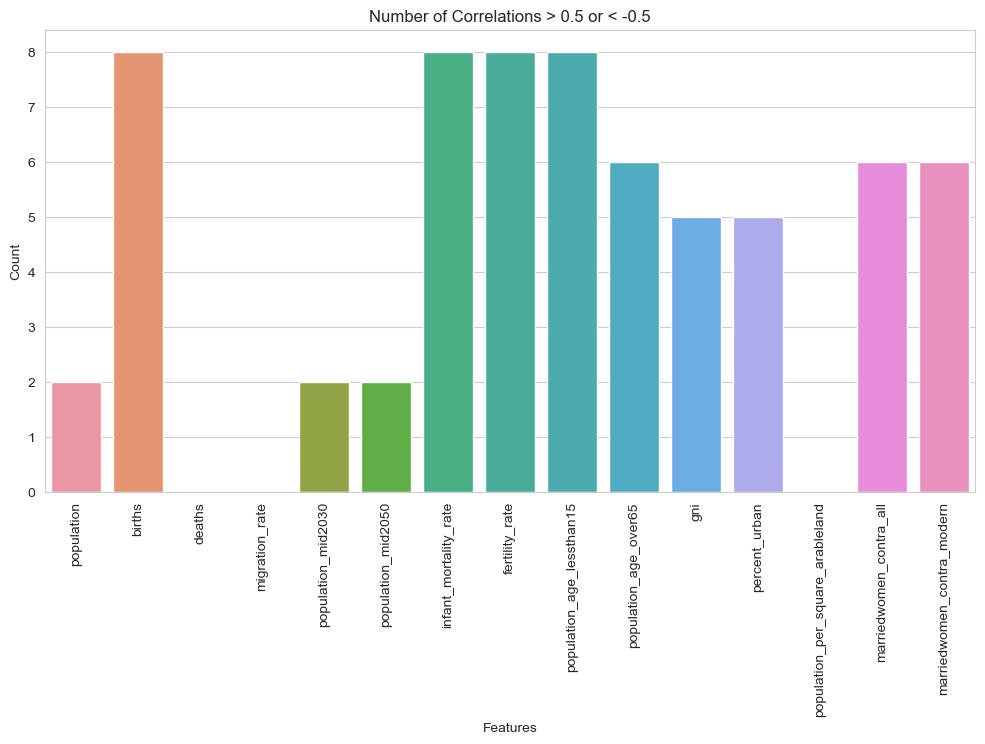

In [3]:
corr_matrix = df_2015.corr()


count_matrix = corr_matrix.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1


sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x=count_matrix.index, y=count_matrix.values)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Number of Correlations > 0.5 or < -0.5')
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\765539176.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_bar_2015 = df_2015.corr()


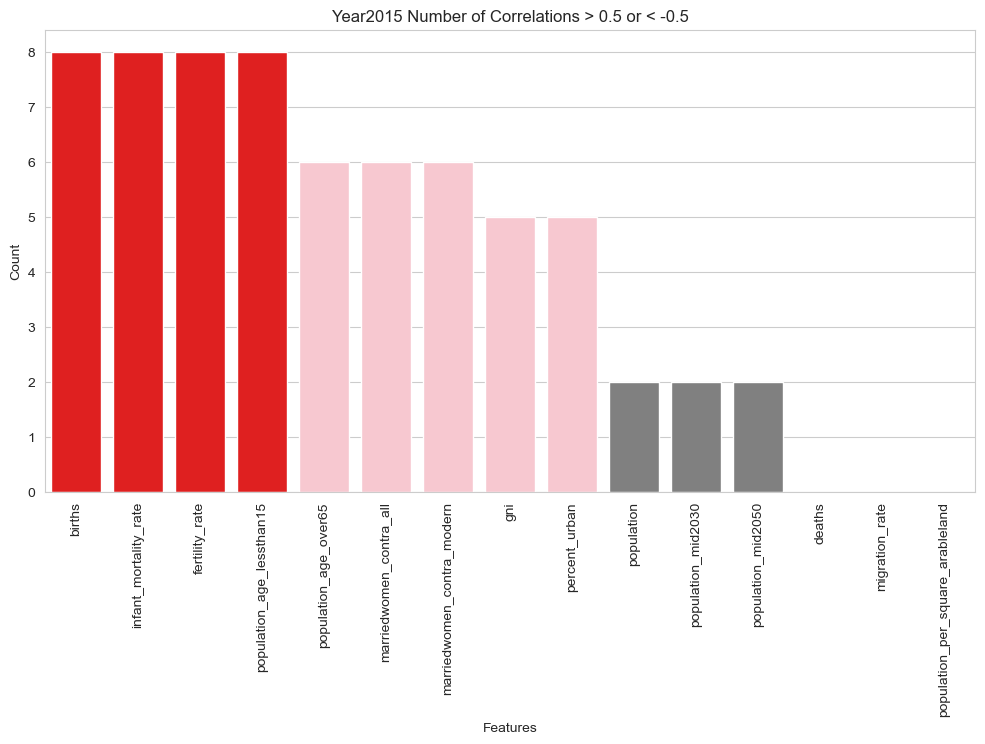

In [4]:
corr_bar_2015 = df_2015.corr()


count_matrix = corr_bar_2015.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1



sorted_count = count_matrix.sort_values(ascending=False)


colors = ['grey']*len(sorted_count)
colors[:4] = ['red']*4
colors[4:9] = ['pink']*5


sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x=sorted_count.index, y=sorted_count.values, palette=colors)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Year2015 Number of Correlations > 0.5 or < -0.5')
plt.show()

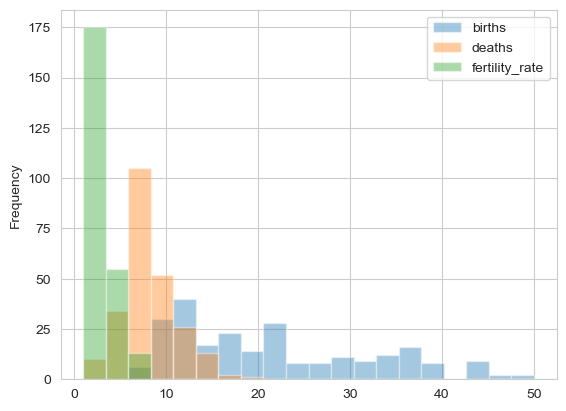

In [5]:
df = df_2015[['births', 'deaths', 'fertility_rate']]


axes = df.plot( kind='hist',
                subplots=False,
                bins=20,
                alpha=0.4,
          )

In [6]:
#df_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 248 entries, 0 to 247
Data columns (total 15 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   country                     243 non-null    object 
 1   population                  243 non-null    object 
 2   births                      243 non-null    float64
 3   deaths                      243 non-null    float64
 4   migration_rate              243 non-null    object 
 5   population_mid2030          243 non-null    object 
 6   population_mid2050          243 non-null    object 
 7   infant_mortality_rate       243 non-null    object 
 8   fertility_rate              243 non-null    float64
 9   population_age_lessthan15   243 non-null    float64
 10  population_age_over65       243 non-null    float64
 11  gni                         243 non-null    object 
 12  percent_urban               243 non-null    float64
 13  marriedwomen_contra_all     243 non

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\22314666.py:8: FutureWarning: The default value of regex will change from True to False in a future version.
  df_2016[col] = df_2016[col].str.replace(',', '').str.replace(r'[\(\)]', '').str.strip()
C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\22314666.py:14: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix_2016 = df_2016.corr().round(2)


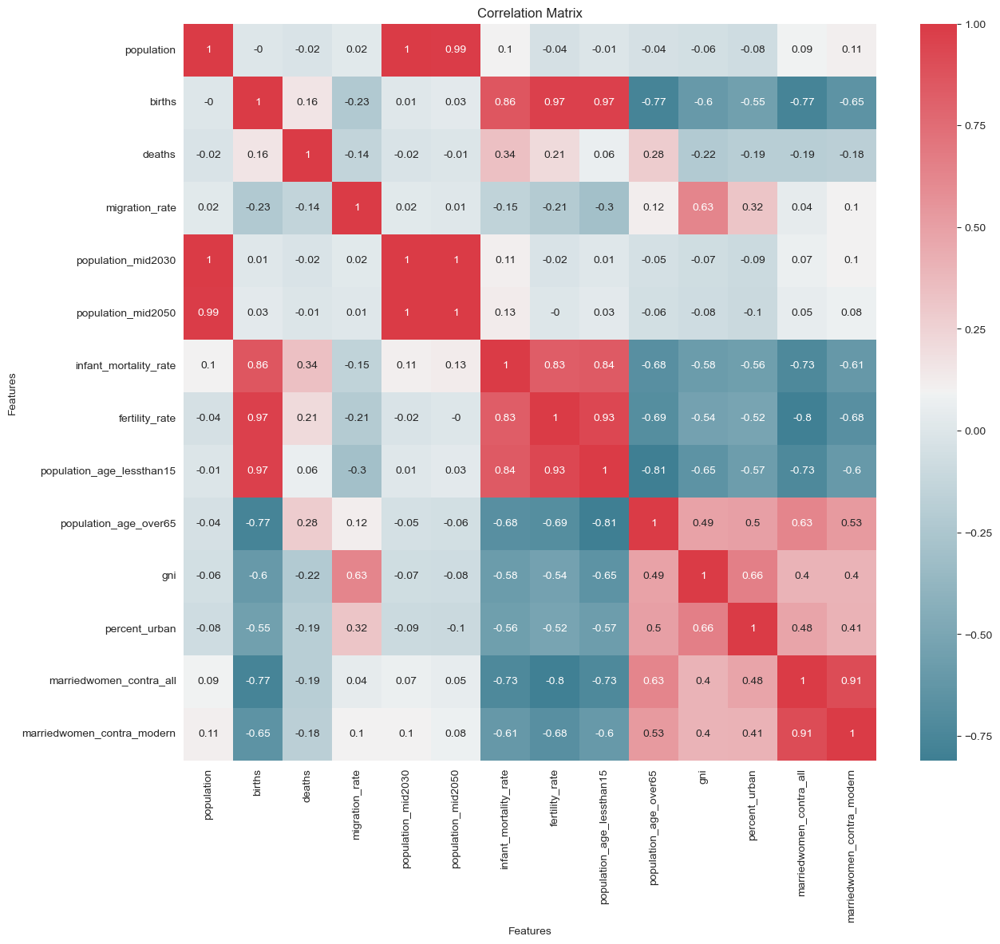

,country,population,births,deaths,migration_rate,population_mid2030,population_mid2050,infant_mortality_rate,fertility_rate,population_age_lessthan15,population_age_over65,gni,percent_urban,marriedwomen_contra_all,marriedwomen_contra_modern
0,WORLD,7418.0,20.0,8.0,NaN,8539.0,9869.0,36.0,2.5,26.0,8.0,15415.0,54.0,62.0,56.0
1,MORE DEVELOPED,1254.0,11.0,10.0,3.0,1298.0,1322.0,5.0,1.7,16.0,18.0,39963.0,78.0,70.0,62.0
2,LESS DEVELOPED,6164.0,22.0,7.0,NaN,7241.0,8548.0,39.0,2.6,28.0,7.0,10214.0,49.0,61.0,55.0
3,LESS DEVELOPED (Excl. China),4778.0,24.0,7.0,NaN,5821.0,7195.0,43.0,2.9,31.0,5.0,8936.0,47.0,54.0,46.0
4,LEAST DEVELOPED,962.0,33.0,9.0,-1.0,1318.0,1923.0,59.0,4.3,41.0,4.0,2424.0,32.0,36.0,32.0


In [7]:
df_2016 = pd.read_csv('2016.csv')
df_2016.info()

cols_to_convert_2016 = ['population', 'migration_rate', 'population_mid2030', 'population_mid2050', 'infant_mortality_rate', 'gni', 'marriedwomen_contra_all', 'marriedwomen_contra_modern']

for col in cols_to_convert_2016:
    
    df_2016[col] = df_2016[col].str.replace(',', '').str.replace(r'[\(\)]', '').str.strip()
    df_2016.loc[df_2016[col] == '-', col] = np.nan
    df_2016[col] = df_2016[col].astype(float)



corr_matrix_2016 = df_2016.corr().round(2)


fig, ax = plt.subplots(figsize=(14, 12))


cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr_matrix_2016, cmap=cmap,  annot=True, ax=ax)


ax.set_title('Correlation Matrix')
ax.set_xlabel('Features')
ax.set_ylabel('Features')


plt.show()

display(df_2016.head())

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\2916940402.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_2016.corr()


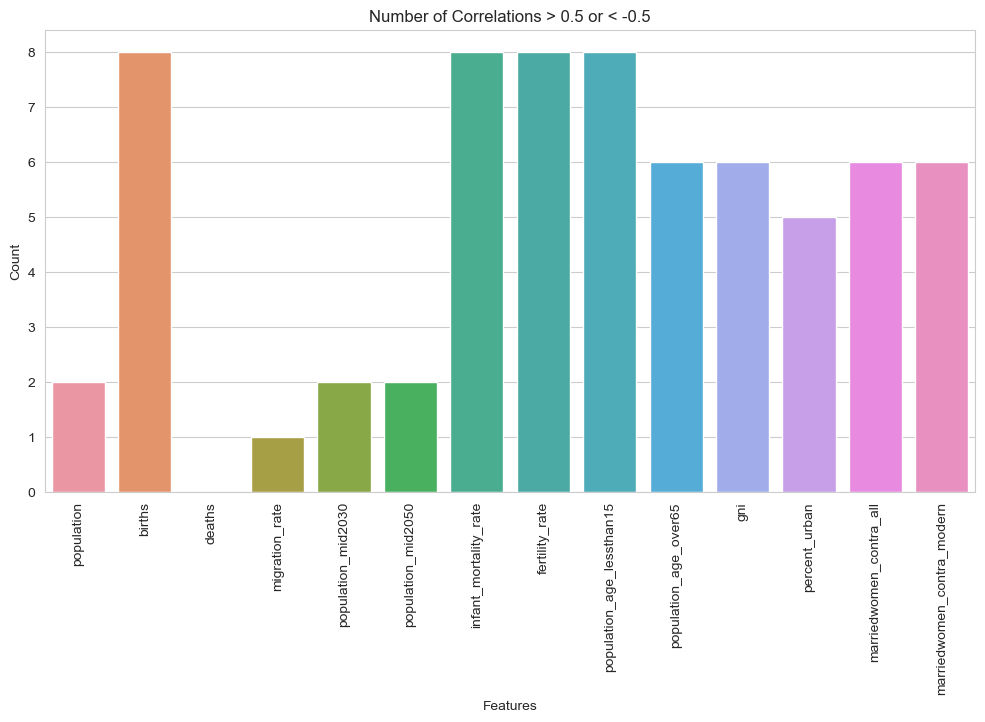

In [8]:
corr_matrix = df_2016.corr()

count_matrix = corr_matrix.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1


sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x=count_matrix.index, y=count_matrix.values)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Number of Correlations > 0.5 or < -0.5')
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\1628288659.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_bar_2016 = df_2016.corr()


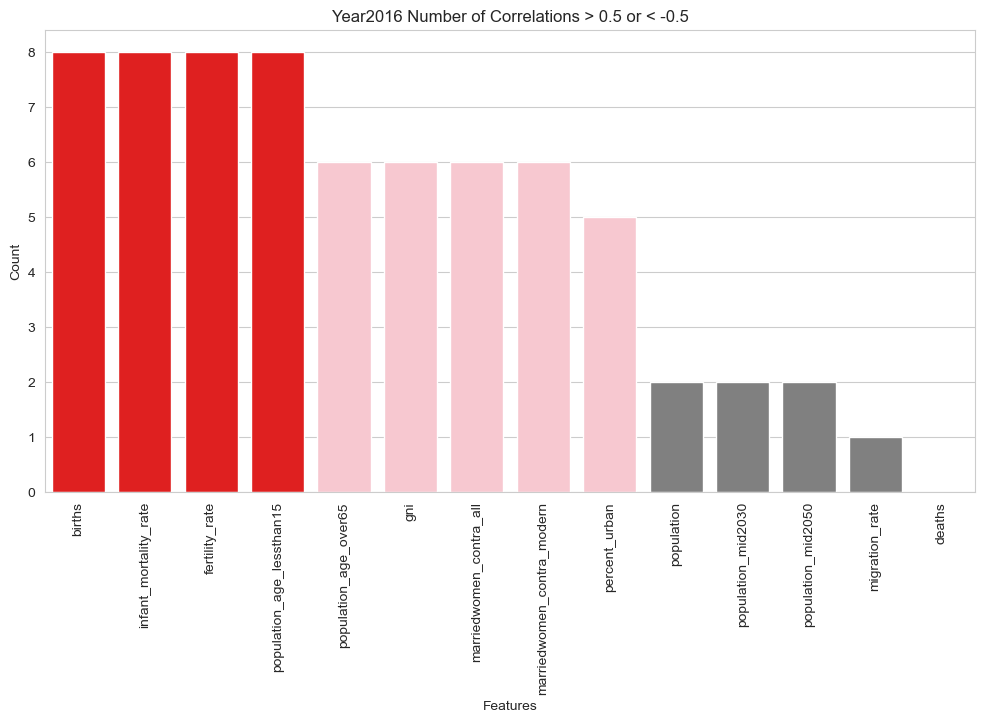

In [9]:
corr_bar_2016 = df_2016.corr()


count_matrix = corr_bar_2016.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1



sorted_count = count_matrix.sort_values(ascending=False)


colors = ['grey']*len(sorted_count)
colors[:4] = ['red']*4
colors[4:9] = ['pink']*5


sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x=sorted_count.index, y=sorted_count.values, palette=colors)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Year2016 Number of Correlations > 0.5 or < -0.5')
plt.show()

In [10]:
#df_2017.info()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\2684826403.py:9: FutureWarning: The default value of regex will change from True to False in a future version.
  df_2017[col] = df_2017[col].str.replace(',', '').str.replace(r'[\(\)]', '').str.replace('L', '1').str.strip()
C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\2684826403.py:15: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix_2017 = df_2017.corr().round(2)


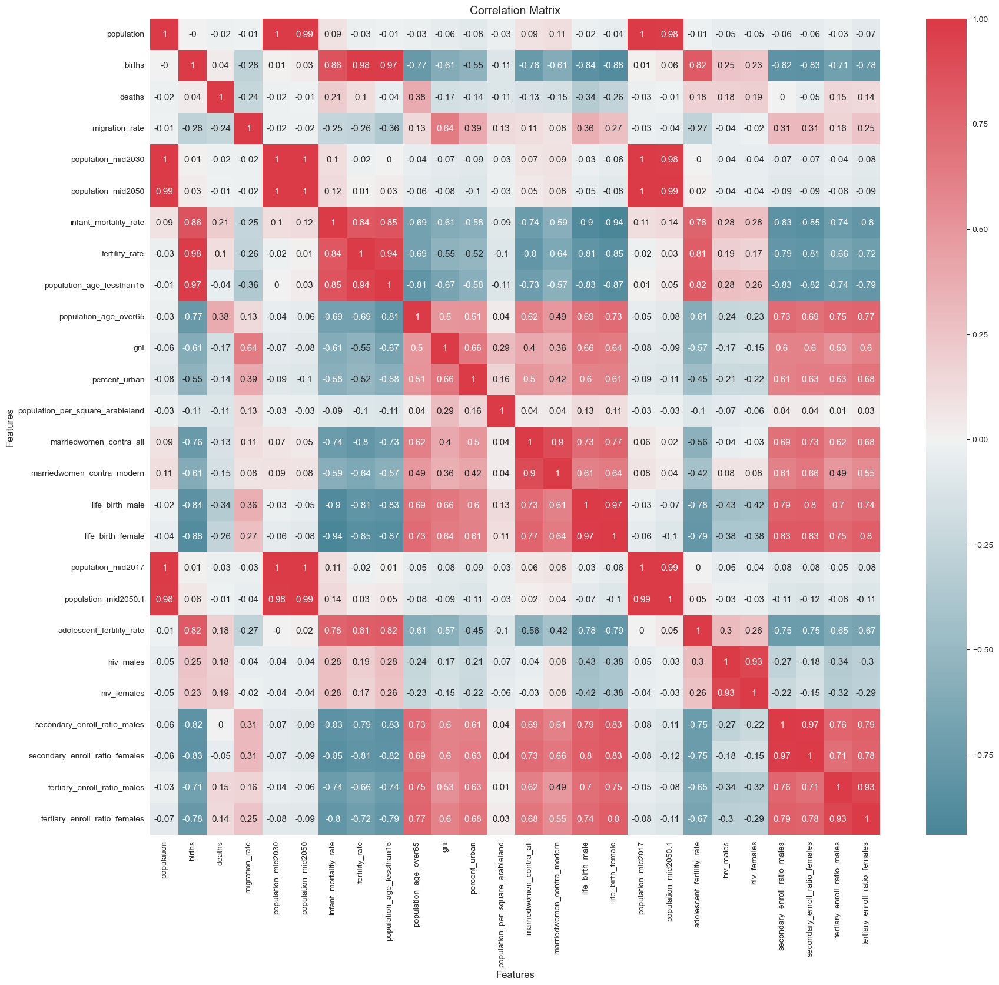

,country,population,births,deaths,migration_rate,population_mid2030,population_mid2050,infant_mortality_rate,fertility_rate,population_age_lessthan15,...,life_birth_female,population_mid2017,population_mid2050.1,adolescent_fertility_rate,hiv_males,hiv_females,secondary_enroll_ratio_males,secondary_enroll_ratio_females,tertiary_enroll_ratio_males,tertiary_enroll_ratio_females
0,WORLD,7536.0,20,8,NaN,8563.0,9846.0,32.0,2.5,26,...,74.0,1189.0,1355.0,50.0,NaN,NaN,77.0,76.0,34.0,38.0
1,MORE DEVELOPED,1263.0,11,10,3.0,1304.0,1325.0,5.0,1.6,16,...,82.0,143.0,140.0,16.0,NaN,NaN,107.0,107.0,67.0,84.0
2,LESS DEVELOPED,6273.0,21,7,NaN,7259.0,8520.0,35.0,2.6,28,...,72.0,1046.0,1215.0,54.0,0.4,0.6,74.0,73.0,29.0,31.0
3,LESS DEVELOPED (Excl. China),4878.0,24,7,NaN,5832.0,7169.0,39.0,2.9,31,...,71.0,880.0,1085.0,62.0,0.4,0.6,71.0,70.0,27.0,27.0
4,LEAST DEVELOPED,1001.0,33,8,-1.0,1340.0,1952.0,52.0,4.3,40,...,66.0,200.0,349.0,106.0,0.5,1.0,46.0,41.0,11.0,7.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243 entries, 0 to 242
Data columns (total 27 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   country                           243 non-null    object 
 1   population                        243 non-null    float64
 2   births                            243 non-null    int64  
 3   deaths                            243 non-null    int64  
 4   migration_rate                    195 non-null    float64
 5   population_mid2030                243 non-null    float64
 6   population_mid2050                243 non-null    float64
 7   infant_mortality_rate             242 non-null    float64
 8   fertility_rate                    243 non-null    float64
 9   population_age_lessthan15         243 non-null    int64  
 10  population_age_over65             243 non-null    int64  
 11  gni                               221 non-null    float64
 12  percent_

In [11]:
df_2017 = pd.read_csv('2017.csv')
#df_2017.info()


cols_to_convert_2017 = ['population', 'migration_rate', 'population_mid2030', 'population_mid2050', 'gni', 'population_per_square_arableland', 'marriedwomen_contra_all', 'marriedwomen_contra_modern', 'life_birth_male', 'life_birth_female', 'population_mid2017', 'population_mid2050.1', 'adolescent_fertility_rate', 'hiv_males', 'hiv_females', 'secondary_enroll_ratio_males', 'secondary_enroll_ratio_females', 'tertiary_enroll_ratio_males', 'tertiary_enroll_ratio_females']

for col in cols_to_convert_2017:
    
    df_2017[col] = df_2017[col].str.replace(',', '').str.replace(r'[\(\)]', '').str.replace('L', '1').str.strip()
    df_2017.loc[df_2017[col] == '-', col] = np.nan
    df_2017[col] = df_2017[col].astype(float)



corr_matrix_2017 = df_2017.corr().round(2)


fig, ax = plt.subplots(figsize=(20, 18))



cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr_matrix_2017, annot=True, cmap=cmap, annot_kws={"fontsize": 11}, ax=ax, center=0)


ax.set_title('Correlation Matrix', fontsize=14)
ax.set_xlabel('Features', fontsize=12)
ax.set_ylabel('Features', fontsize=12)

ax.tick_params(axis='x', labelrotation=90)


plt.show()

display(df_2017.head())
df_2017.info()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\3719981907.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_2017.corr()


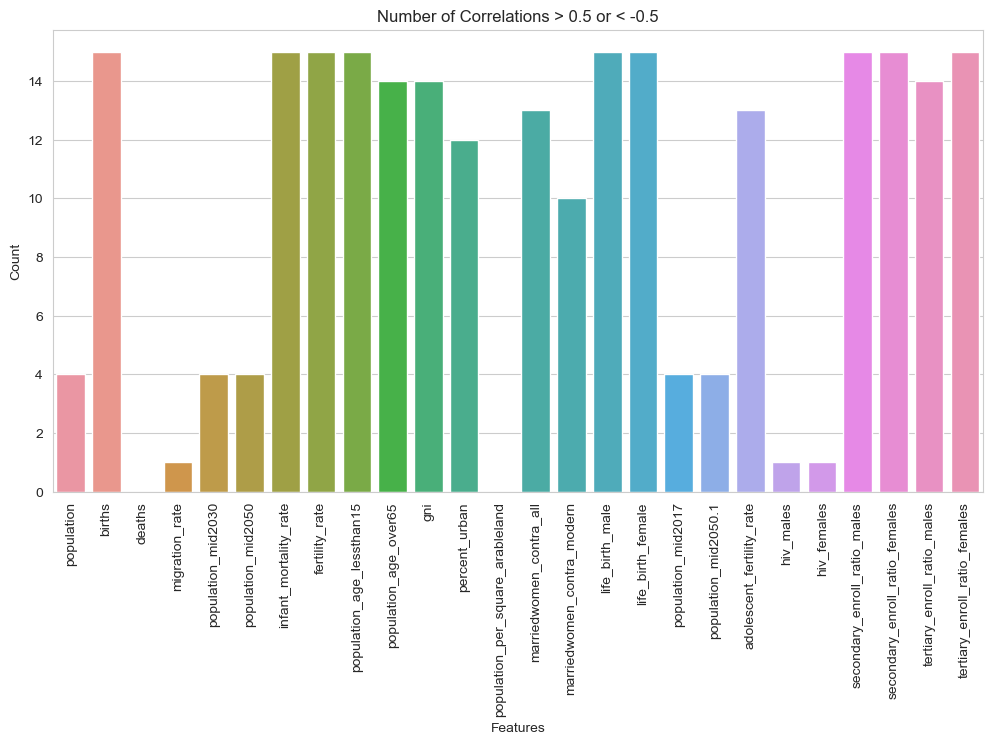

In [12]:
corr_matrix = df_2017.corr()


count_matrix = corr_matrix.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1


sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x=count_matrix.index, y=count_matrix.values)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Number of Correlations > 0.5 or < -0.5')
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\838746881.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_2017.corr()


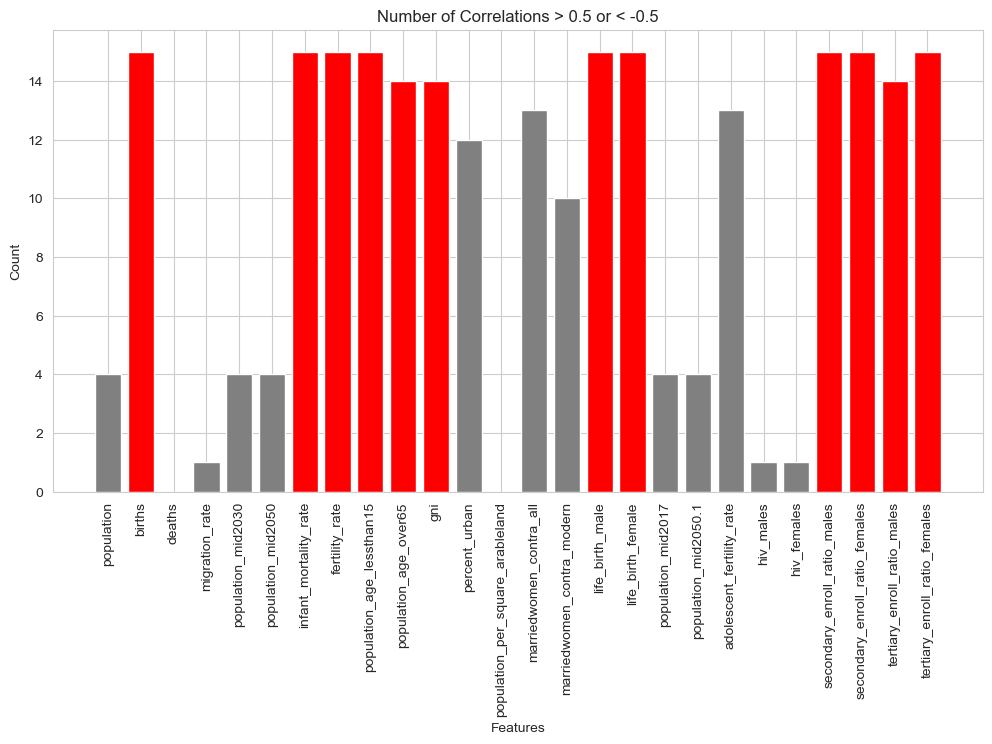

In [13]:
corr_matrix = df_2017.corr()


count_matrix = corr_matrix.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1


top5_indices = count_matrix.sort_values(ascending=False)[:12].index



sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
for i, idx in enumerate(count_matrix.index):
    color = "red" if idx in top5_indices else "grey" # set color to red if the index is in the top 5, otherwise grey
    plt.bar(i, count_matrix[idx], color=color)
plt.xticks(range(len(count_matrix.index)), count_matrix.index, rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Number of Correlations > 0.5 or < -0.5')
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\3089029536.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_bar_2017 = df_2017.corr()


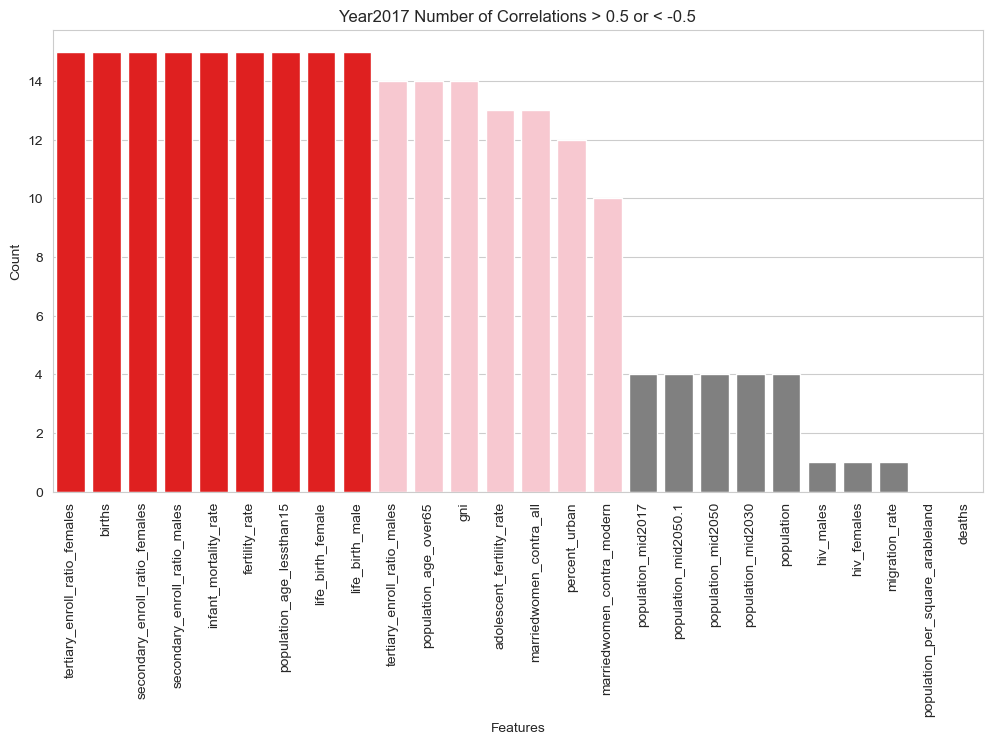

In [14]:
corr_bar_2017 = df_2017.corr()


count_matrix = corr_bar_2017.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1



sorted_count = count_matrix.sort_values(ascending=False)


colors = ['grey']*len(sorted_count)
colors[:9] = ['red']*9
colors[9:16] = ['pink']*7


sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x=sorted_count.index, y=sorted_count.values, palette=colors)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Year2017 Number of Correlations > 0.5 or < -0.5')
plt.show()

In [15]:
#df_2018.info()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\788897963.py:8: FutureWarning: The default value of regex will change from True to False in a future version.
  df_2018[col] = df_2018[col].str.replace(',', '').str.replace(r'[\(\)]', '').str.strip()
C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\788897963.py:13: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix_2018 = df_2018.corr().round(2)


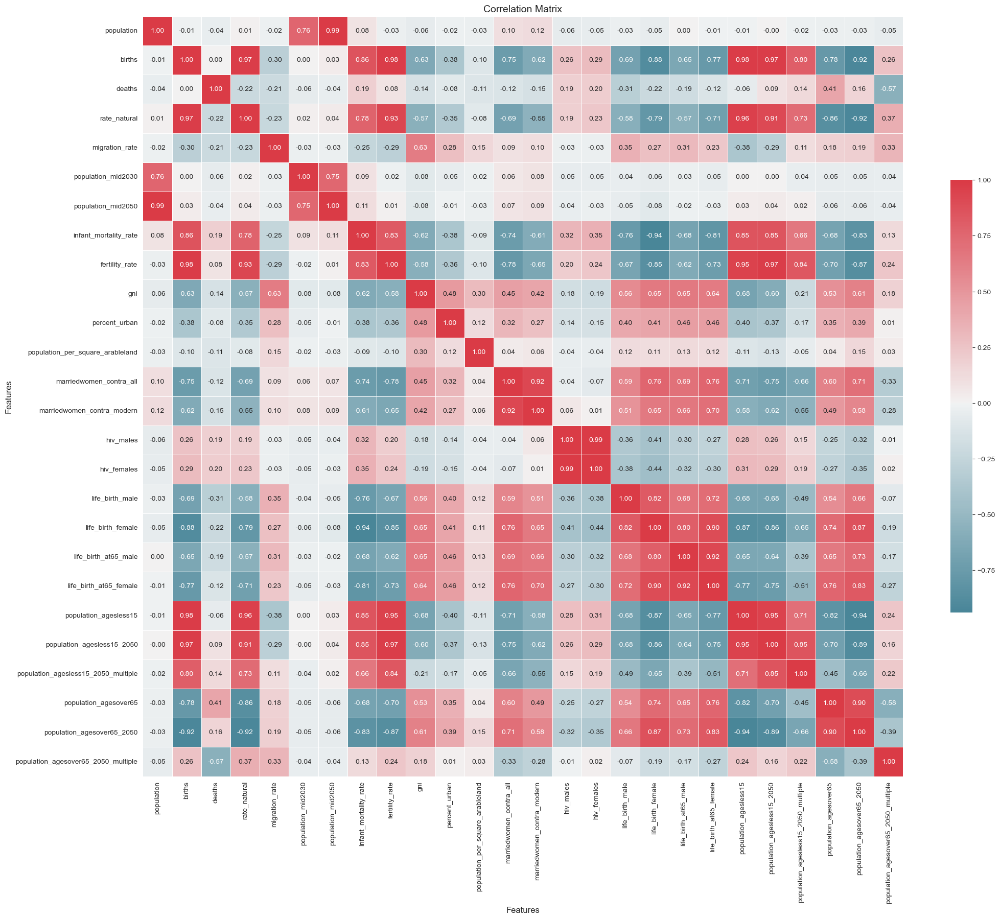

,country,population,births,deaths,rate_natural,migration_rate,population_mid2030,population_mid2050,infant_mortality_rate,fertility_rate,...,life_birth_male,life_birth_female,life_birth_at65_male,life_birth_at65_female,population_agesless15,population_agesless15_2050,population_agesless15_2050_multiple,population_agesover65,population_agesover65_2050,population_agesover65_2050_multiple
0,WORLD,7621.0,19.0,7.0,1.2,NaN,8571.0,9852.0,31.0,2.4,...,70.0,74.0,16.0,18.0,26.0,21.0,1.1,9,16.0,2.3
1,MORE DEVELOPED,1266.0,10.0,10.0,NaN,3.0,1301.0,1312.0,5.0,1.6,...,76.0,82.0,18.0,21.0,16.0,16.0,1.0,18,27.0,1.5
2,LESS DEVELOPED,6355.0,21.0,7.0,1.4,-1.0,7207.0,8540.0,34.0,2.6,...,69.0,73.0,15.0,17.0,28.0,22.0,1.1,7,14.0,2.8
3,LESS DEVELOPED (EXCL.CHINA),4953.0,23.0,7.0,1.7,-1.0,5841.0,7187.0,37.0,2.8,...,67.0,71.0,15.0,17.0,31.0,24.0,1.1,6,12.0,3.0
4,LESS DEVELOPED,1027.0,33.0,8.0,2.5,-1.0,1342.0,1954.0,49.0,4.2,...,63.0,66.0,14.0,15.0,40.0,31.0,1.5,4,7.0,3.5


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243 entries, 0 to 242
Data columns (total 27 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   country                              243 non-null    object 
 1   population                           243 non-null    float64
 2   births                               242 non-null    float64
 3   deaths                               242 non-null    float64
 4   rate_natural                         234 non-null    float64
 5   migration_rate                       190 non-null    float64
 6   population_mid2030                   243 non-null    float64
 7   population_mid2050                   243 non-null    float64
 8   infant_mortality_rate                242 non-null    float64
 9   fertility_rate                       242 non-null    float64
 10  gni                                  221 non-null    float64
 11  percent_urban                   

In [16]:
df_2018 = pd.read_csv('2018.csv')

cols_to_convert_2018 = ['population', 'births', 'deaths', 'rate_natural', 'migration_rate', 'population_mid2030', 'population_mid2050', 'infant_mortality_rate', 'gni', 'population_per_square_arableland', 'marriedwomen_contra_all', 'marriedwomen_contra_modern', 'hiv_males', 'hiv_females', 'life_birth_male', 'life_birth_female', 'life_birth_at65_male', 'life_birth_at65_female', 'population_agesless15', 'population_agesless15_2050', 'population_agesless15_2050_multiple', 'population_agesover65_2050', 'population_agesover65_2050_multiple']


for col in cols_to_convert_2018:
    
    df_2018[col] = df_2018[col].str.replace(',', '').str.replace(r'[\(\)]', '').str.strip()
    df_2018.loc[df_2018[col] == '-', col] = np.nan
    df_2018[col] = df_2018[col].astype(float)


corr_matrix_2018 = df_2018.corr().round(2)


fig, ax = plt.subplots(figsize=(24, 22))



cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr_matrix_2018, cmap=cmap, annot=True, fmt='.2f', center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})

ax.set_title('Correlation Matrix', fontsize=14)
ax.set_xlabel('Features', fontsize=12)
ax.set_ylabel('Features', fontsize=12)


plt.show()

display(df_2018.head())
df_2018.info()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\1752646579.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_2018.corr()


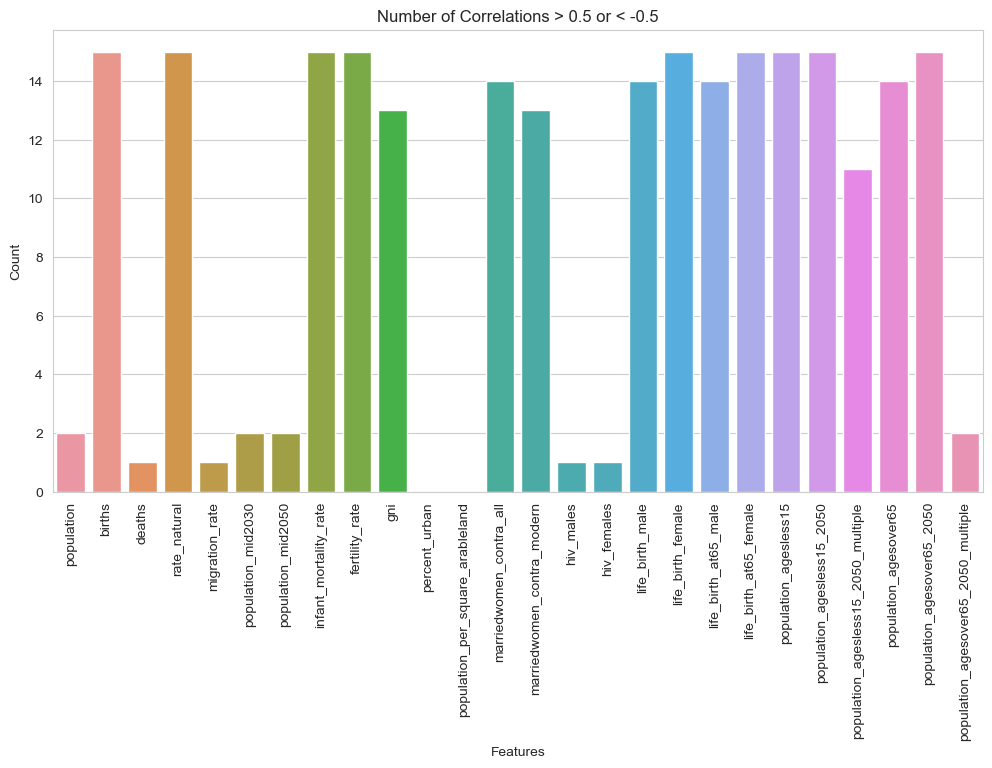

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt


corr_matrix = df_2018.corr()


count_matrix = corr_matrix.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1


sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x=count_matrix.index, y=count_matrix.values)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Number of Correlations > 0.5 or < -0.5')
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\3103836522.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_2018.corr()


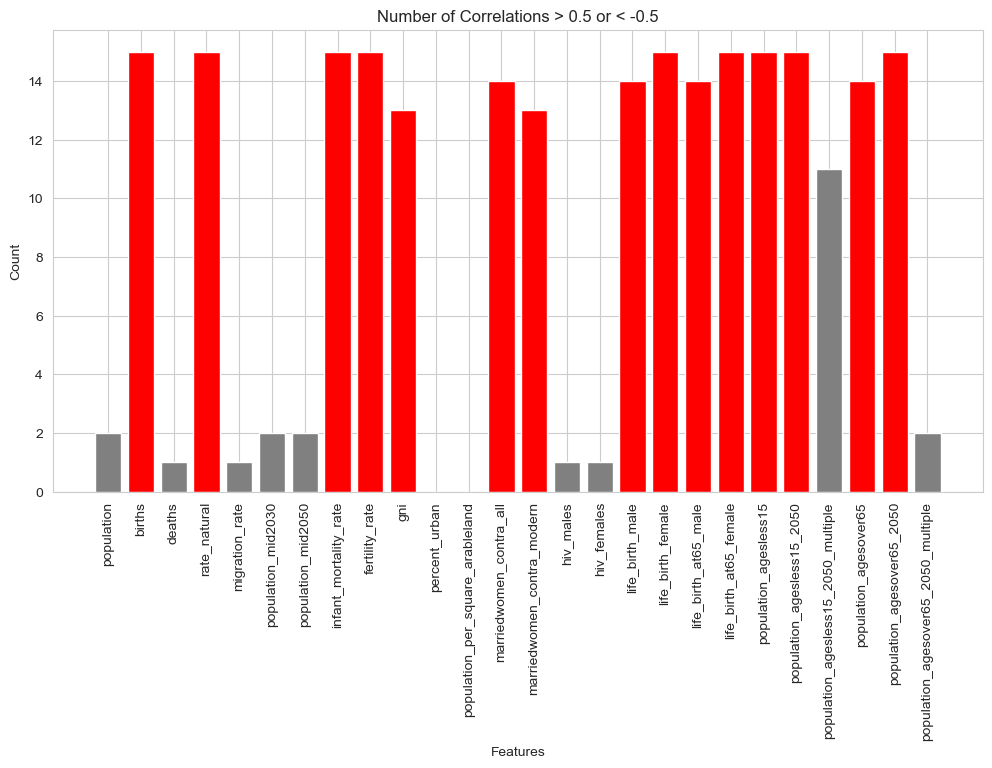

In [18]:
corr_matrix = df_2018.corr()


count_matrix = corr_matrix.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1


top5_indices = count_matrix.sort_values(ascending=False)[:15].index



sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
for i, idx in enumerate(count_matrix.index):
    color = "red" if idx in top5_indices else "grey" # set color to red if the index is in the top 5, otherwise grey
    plt.bar(i, count_matrix[idx], color=color)
plt.xticks(range(len(count_matrix.index)), count_matrix.index, rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Number of Correlations > 0.5 or < -0.5')
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\3475516390.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_bar_2018 = df_2018.corr()


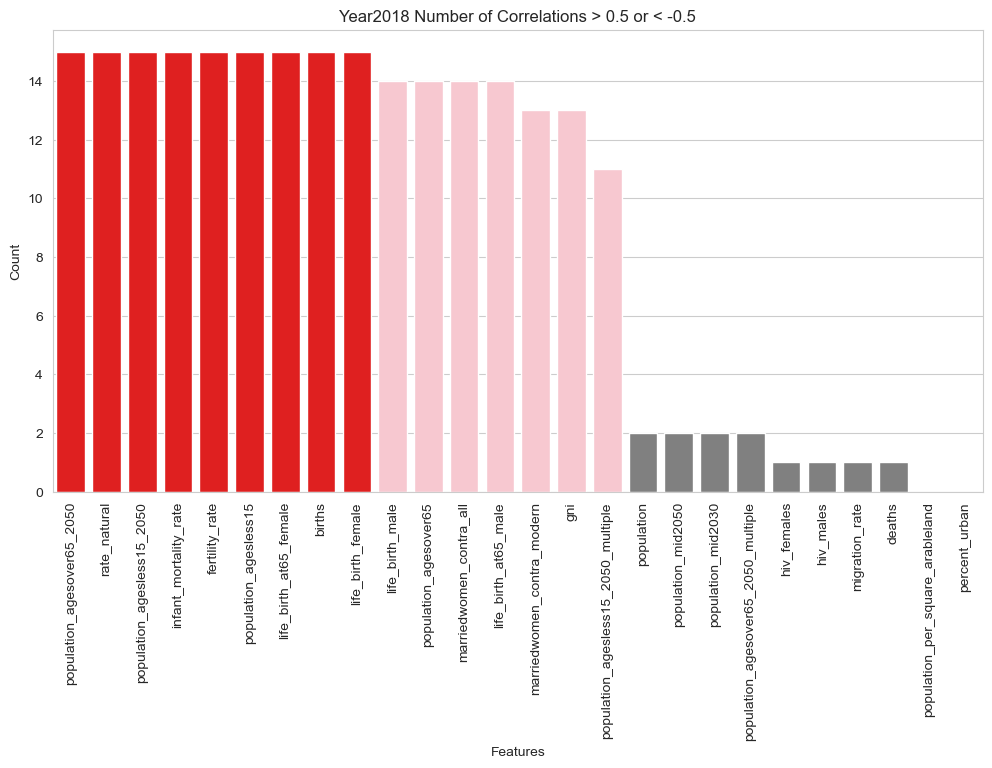

In [19]:
corr_bar_2018 = df_2018.corr()


count_matrix = corr_bar_2018.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1



sorted_count = count_matrix.sort_values(ascending=False)


colors = ['grey']*len(sorted_count)
colors[:9] = ['red']*9
colors[9:16] = ['pink']*7


sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x=sorted_count.index, y=sorted_count.values, palette=colors)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Year2018 Number of Correlations > 0.5 or < -0.5')
plt.show()

In [20]:
#df_2019.info()

last_census    int64
dtype: object


C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\2761469752.py:14: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix_2019 = df_2019.corr().round(2)


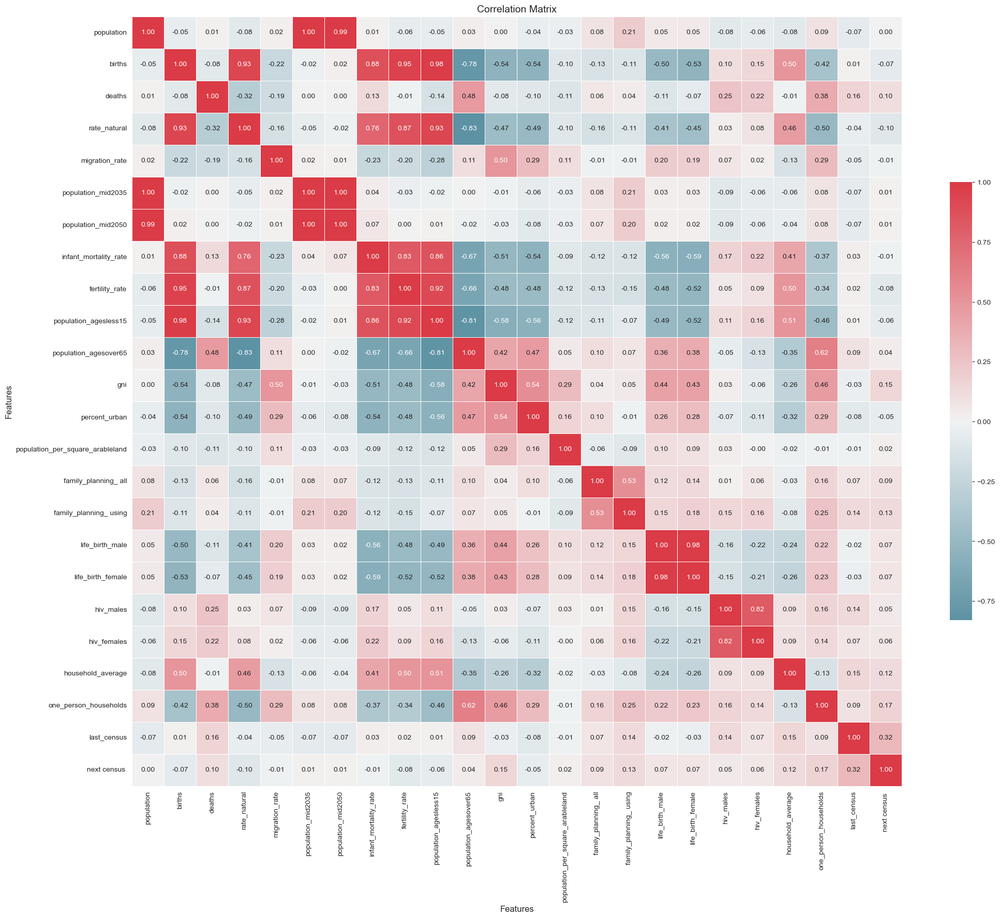

,country,population,births,deaths,rate_natural,migration_rate,population_mid2035,population_mid2050,infant_mortality_rate,fertility_rate,...,family_planning_ all,family_planning_ using,life_birth_male,life_birth_female,hiv_males,hiv_females,household_average,one_person_households,last_census,next census
0,Algeria,43,25,5,2,0,53,61,21,3,...,57,50,77,78,1,1,0,0,2008,2020
1,Egypt,99,25,6,2,0,129,158,15,3,...,59,57,71,74,1,1,4,6,2017,0
2,Libya,7,19,5,1,0,8,9,10,2,...,28,16,70,76,1,1,0,0,2006,0
3,Morocco,36,17,5,1,-2,41,44,20,2,...,71,58,75,78,1,1,4,0,2014,2024
4,Sudan,43,33,7,3,-1,62,81,43,5,...,12,12,63,67,1,1,6,2,2008,2019


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211 entries, 0 to 210
Data columns (total 25 columns):
 #   Column                            Non-Null Count  Dtype 
---  ------                            --------------  ----- 
 0   country                           211 non-null    object
 1   population                        211 non-null    int64 
 2   births                            211 non-null    int64 
 3   deaths                            211 non-null    int64 
 4   rate_natural                      211 non-null    int64 
 5   migration_rate                    211 non-null    int64 
 6   population_mid2035                211 non-null    int64 
 7   population_mid2050                211 non-null    int64 
 8   infant_mortality_rate             211 non-null    int64 
 9   fertility_rate                    211 non-null    int64 
 10  population_agesless15             211 non-null    int64 
 11  population_agesover65             211 non-null    int64 
 12  gni                   

In [21]:
df_2019 = pd.read_csv('2019.csv')

cols_to_convert_2019 = ['last_census']

print(df_2019[cols_to_convert_2019].dtypes)

for col in cols_to_convert_2019:
    
    df_2019.loc[df_2019[col] == '-', col] = np.nan
    df_2019[col] = df_2019[col].astype(int)



corr_matrix_2019 = df_2019.corr().round(2)


fig, ax = plt.subplots(figsize=(24, 22))



cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr_matrix_2019, cmap=cmap, annot=True, fmt='.2f', center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})


ax.set_title('Correlation Matrix', fontsize=14)
ax.set_xlabel('Features', fontsize=12)
ax.set_ylabel('Features', fontsize=12)



plt.show()

display(df_2019.head())
df_2019.info()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\2442905635.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_2019.corr()


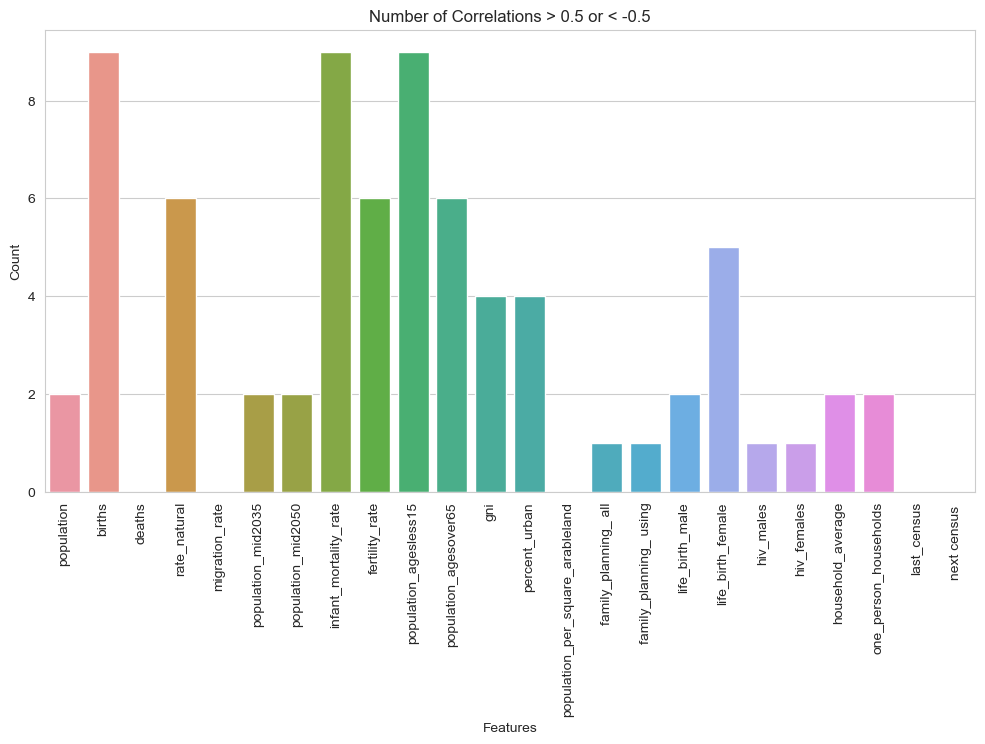

In [22]:
corr_matrix = df_2019.corr()


count_matrix = corr_matrix.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1


sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x=count_matrix.index, y=count_matrix.values)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Number of Correlations > 0.5 or < -0.5')
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\1390009880.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_bar_2019 = df_2019.corr()


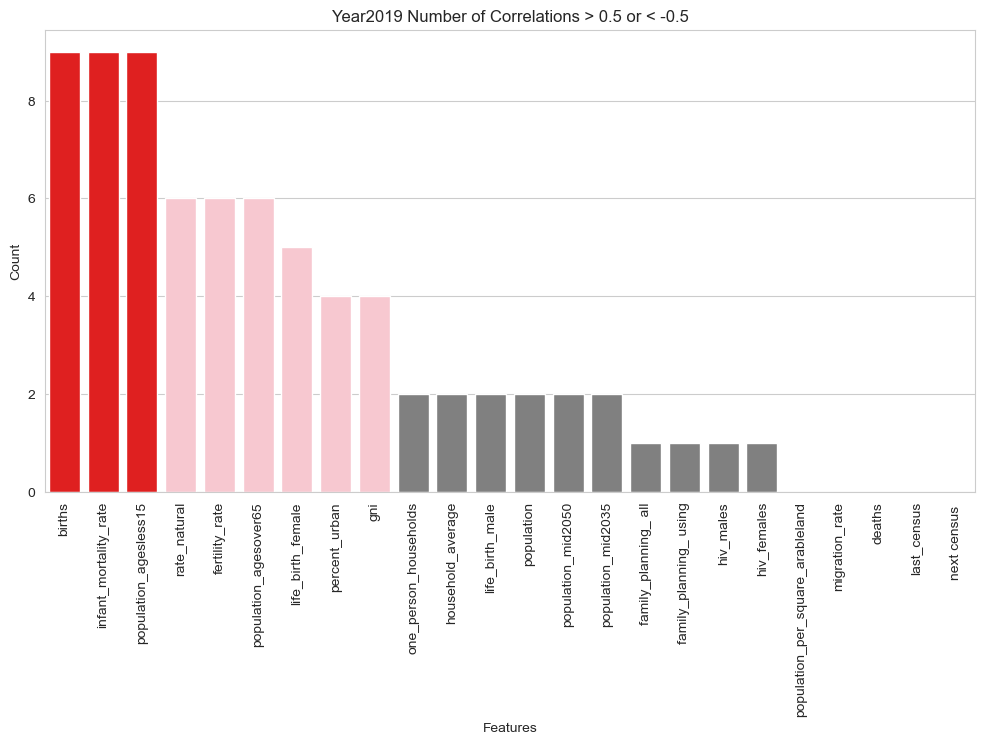

In [23]:
corr_bar_2019 = df_2019.corr()


count_matrix = corr_bar_2019.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1



sorted_count = count_matrix.sort_values(ascending=False)


colors = ['grey']*len(sorted_count)
colors[:3] = ['red']*3
colors[3:9] = ['pink']*6


sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x=sorted_count.index, y=sorted_count.values, palette=colors)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Year2019 Number of Correlations > 0.5 or < -0.5')
plt.show()

In [24]:
#df_2020.info()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\1167761330.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_2020.corr()


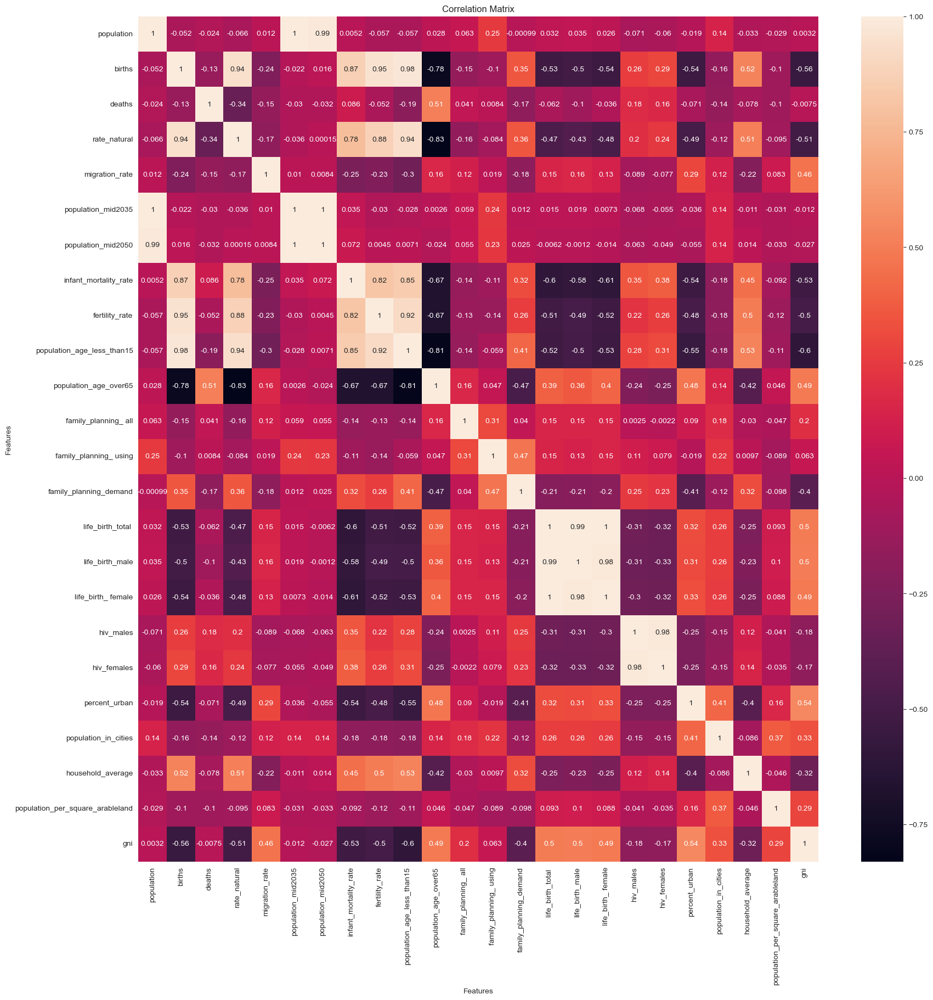

,country,population,births,deaths,rate_natural,migration_rate,population_mid2035,population_mid2050,infant_mortality_rate,fertility_rate,...,life_birth_total,life_birth_male,life_birth_ female,hiv_males,hiv_females,percent_urban,population_in_cities,household_average,population_per_square_arableland,gni
0,Algeria,44,24,5,2,0,53,61,21,3,...,78,77,78,0,0,73,6,0,594,11370
1,Egypt,101,23,6,2,0,129,158,15,3,...,74,73,75,0,0,43,25,4,3617,11350
2,Libya,7,24,4,2,0,8,10,12,3,...,76,74,79,0,0,80,17,0,401,14820
3,Morocco,36,17,5,1,-1,41,44,18,2,...,76,75,78,0,0,63,24,4,460,8430
4,Sudan,44,32,7,3,-1,62,81,42,4,...,65,63,67,0,0,36,13,6,221,4430


In [25]:
df_2020 = pd.read_csv('2020.csv')


df_2020_dna = df_2020.dropna()
corr_matrix = df_2020.corr()


fig, ax = plt.subplots(figsize=(20,20))


sns.heatmap(corr_matrix,  annot=True, ax=ax)


ax.set_title('Correlation Matrix')
ax.set_xlabel('Features')
ax.set_ylabel('Features')


plt.show()

display(df_2020.head())

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\3213360562.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix_2020 = df_2020.corr().round(2)


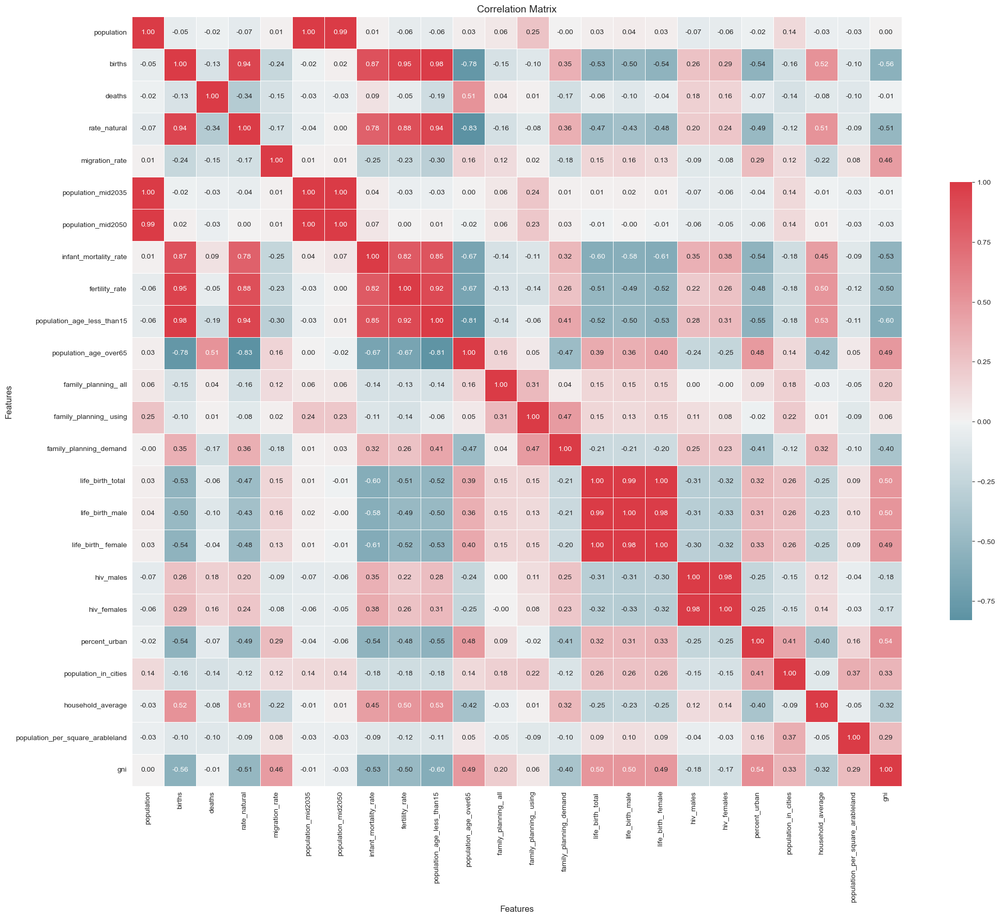

,country,population,births,deaths,rate_natural,migration_rate,population_mid2035,population_mid2050,infant_mortality_rate,fertility_rate,...,life_birth_total,life_birth_male,life_birth_ female,hiv_males,hiv_females,percent_urban,population_in_cities,household_average,population_per_square_arableland,gni
0,Algeria,44,24,5,2,0,53,61,21,3,...,78,77,78,0,0,73,6,0,594,11370
1,Egypt,101,23,6,2,0,129,158,15,3,...,74,73,75,0,0,43,25,4,3617,11350
2,Libya,7,24,4,2,0,8,10,12,3,...,76,74,79,0,0,80,17,0,401,14820
3,Morocco,36,17,5,1,-1,41,44,18,2,...,76,75,78,0,0,63,24,4,460,8430
4,Sudan,44,32,7,3,-1,62,81,42,4,...,65,63,67,0,0,36,13,6,221,4430


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 213 entries, 0 to 212
Data columns (total 25 columns):
 #   Column                            Non-Null Count  Dtype 
---  ------                            --------------  ----- 
 0   country                           213 non-null    object
 1   population                        213 non-null    int64 
 2   births                            213 non-null    int64 
 3   deaths                            213 non-null    int64 
 4   rate_natural                      213 non-null    int64 
 5   migration_rate                    213 non-null    int64 
 6   population_mid2035                213 non-null    int64 
 7   population_mid2050                213 non-null    int64 
 8   infant_mortality_rate             213 non-null    int64 
 9   fertility_rate                    213 non-null    int64 
 10  population_age_less_than15        213 non-null    int64 
 11  population_age_over65             213 non-null    int64 
 12  family_planning_ all  

In [26]:
df_2020 = pd.read_csv('2020.csv')



corr_matrix_2020 = df_2020.corr().round(2)



fig, ax = plt.subplots(figsize=(24, 22))



cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr_matrix_2020, cmap=cmap, annot=True, fmt='.2f', center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})


ax.set_title('Correlation Matrix', fontsize=14)
ax.set_xlabel('Features', fontsize=12)
ax.set_ylabel('Features', fontsize=12)


plt.show()

display(df_2020.head())
df_2020.info()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\925913396.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_2020.corr()


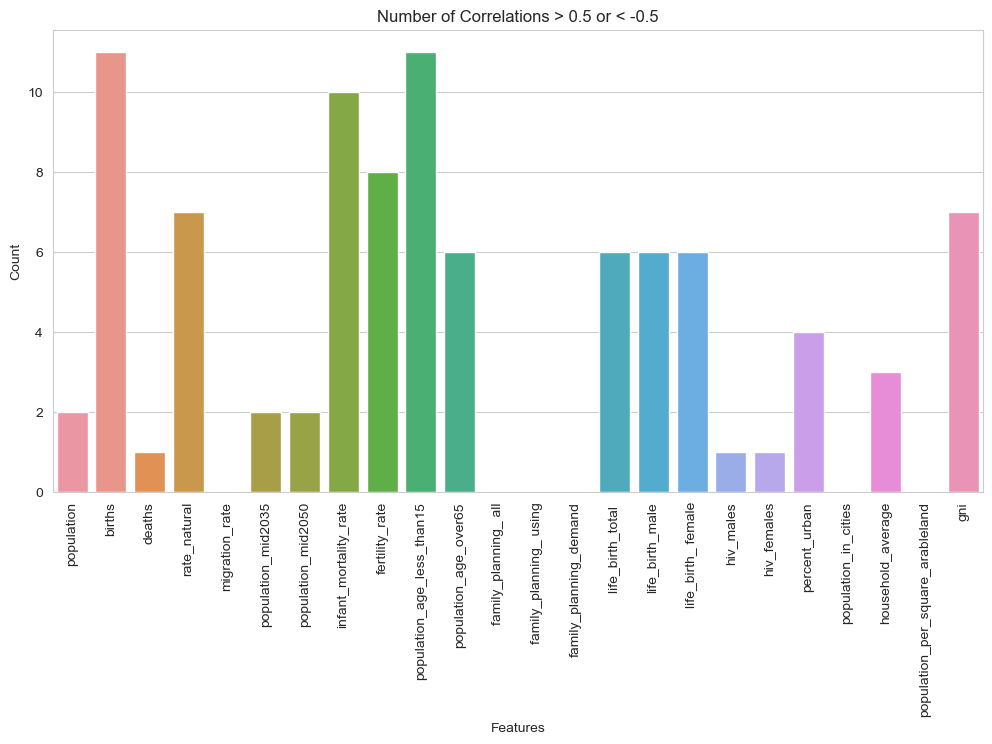

In [27]:
corr_matrix = df_2020.corr()


count_matrix = corr_matrix.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1


sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x=count_matrix.index, y=count_matrix.values)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Number of Correlations > 0.5 or < -0.5')
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\716916055.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_bar_2020 = df_2020.corr()


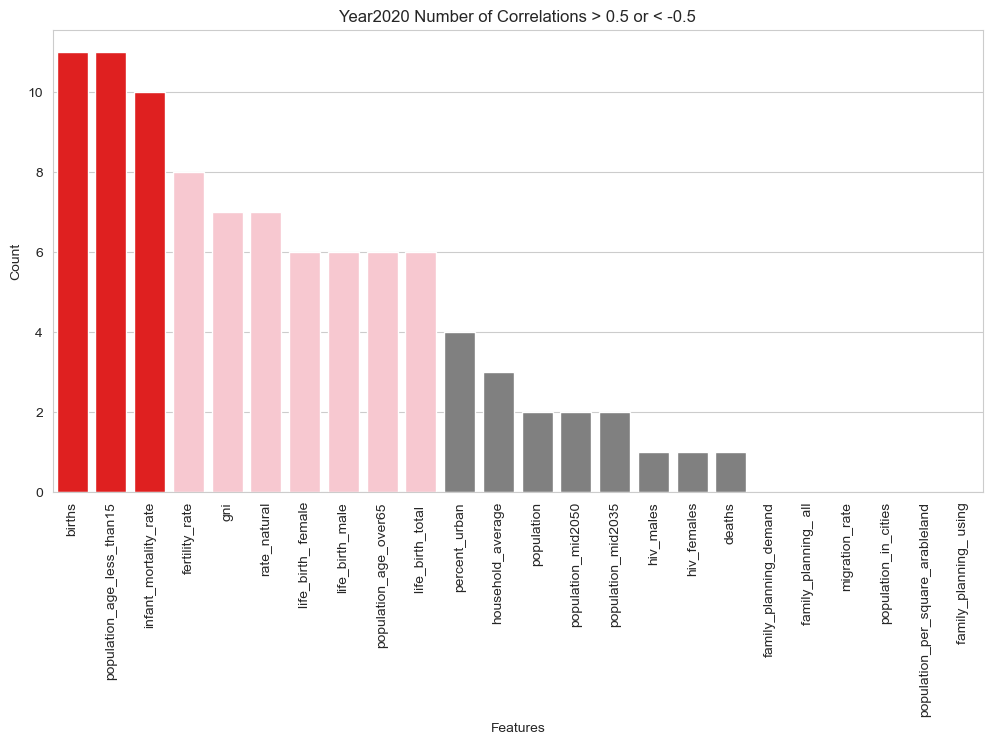

In [28]:
corr_bar_2020 = df_2020.corr()


count_matrix = corr_bar_2020.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1



sorted_count = count_matrix.sort_values(ascending=False)


colors = ['grey']*len(sorted_count)
colors[:3] = ['red']*3
colors[3:10] = ['pink']*7


sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x=sorted_count.index, y=sorted_count.values, palette=colors)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Year2020 Number of Correlations > 0.5 or < -0.5')
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\3943098609.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_2020.corr()


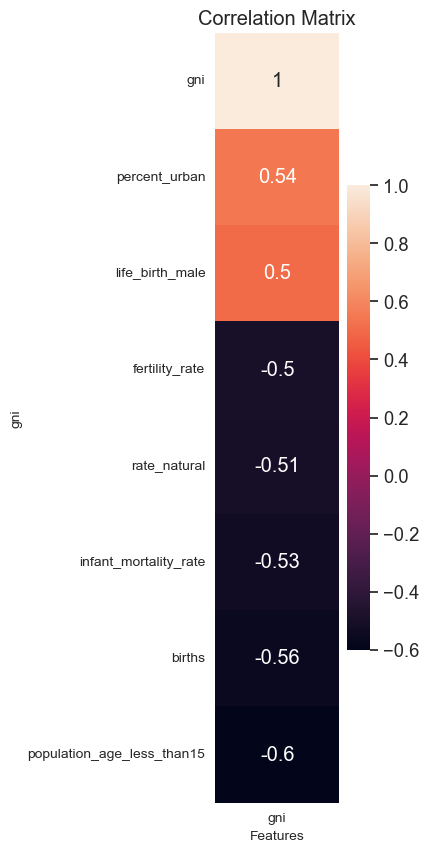

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 213 entries, 0 to 212
Data columns (total 25 columns):
 #   Column                            Non-Null Count  Dtype 
---  ------                            --------------  ----- 
 0   country                           213 non-null    object
 1   population                        213 non-null    int64 
 2   births                            213 non-null    int64 
 3   deaths                            213 non-null    int64 
 4   rate_natural                      213 non-null    int64 
 5   migration_rate                    213 non-null    int64 
 6   population_mid2035                213 non-null    int64 
 7   population_mid2050                213 non-null    int64 
 8   infant_mortality_rate             213 non-null    int64 
 9   fertility_rate                    213 non-null    int64 
 10  population_age_less_than15        213 non-null    int64 
 11  population_age_over65             213 non-null    int64 
 12  family_planning_ all  

gni                1.000000
percent_urban      0.544080
life_birth_male    0.502208
fertility_rate    -0.500605
rate_natural      -0.505176
Name: gni, dtype: float64

In [29]:
corr_matrix = df_2020.corr()
gni2020_corr = corr_matrix["gni"][(corr_matrix["gni"] > 0.5) | (corr_matrix["gni"] < -0.5)]
gni2020_corr = gni2020_corr.sort_values(ascending=False)



fig, ax = plt.subplots(figsize=(2,10))



sns.set(font_scale=1.2, font='Arial')
sns.heatmap(gni2020_corr.to_frame(),  annot=True, ax=ax)


ax.set_title('Correlation Matrix')
ax.set_xlabel('Features')
ax.set_ylabel('gni')


plt.show()

df_2020.info()
display(gni2020_corr.head())

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\1706677758.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_2020.corr()


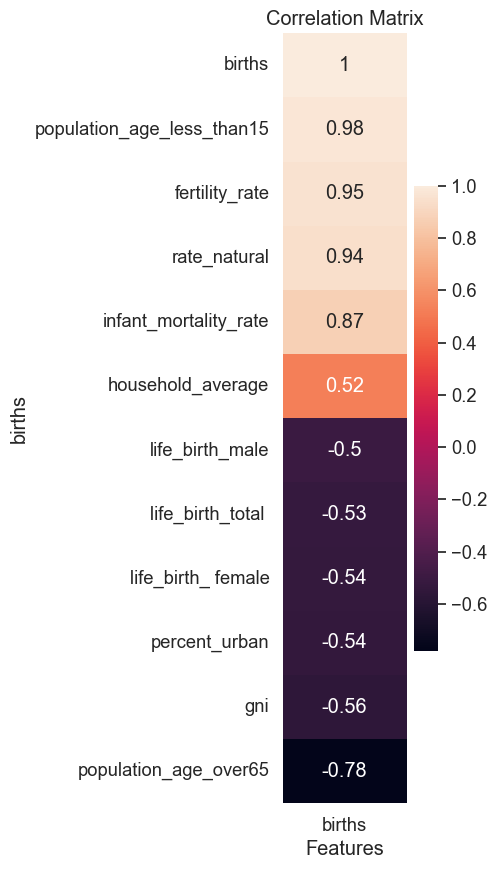

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 213 entries, 0 to 212
Data columns (total 25 columns):
 #   Column                            Non-Null Count  Dtype 
---  ------                            --------------  ----- 
 0   country                           213 non-null    object
 1   population                        213 non-null    int64 
 2   births                            213 non-null    int64 
 3   deaths                            213 non-null    int64 
 4   rate_natural                      213 non-null    int64 
 5   migration_rate                    213 non-null    int64 
 6   population_mid2035                213 non-null    int64 
 7   population_mid2050                213 non-null    int64 
 8   infant_mortality_rate             213 non-null    int64 
 9   fertility_rate                    213 non-null    int64 
 10  population_age_less_than15        213 non-null    int64 
 11  population_age_over65             213 non-null    int64 
 12  family_planning_ all  

births                        1.000000
population_age_less_than15    0.976017
fertility_rate                0.952133
rate_natural                  0.944063
infant_mortality_rate         0.868053
Name: births, dtype: float64

In [30]:
corr_matrix = df_2020.corr()
births2020_corr = corr_matrix["births"][(corr_matrix["births"] > 0.5) | (corr_matrix["births"] < -0.5)]
births2020_corr = births2020_corr.sort_values(ascending=False)



fig, ax = plt.subplots(figsize=(2,10))



sns.set(font_scale=1.2, font='Arial')
sns.heatmap(births2020_corr.to_frame(),  annot=True, ax=ax)


ax.set_title('Correlation Matrix')
ax.set_xlabel('Features')
ax.set_ylabel('births')


plt.show()

df_2020.info()
display(births2020_corr.head())

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\926562730.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_2020.corr()


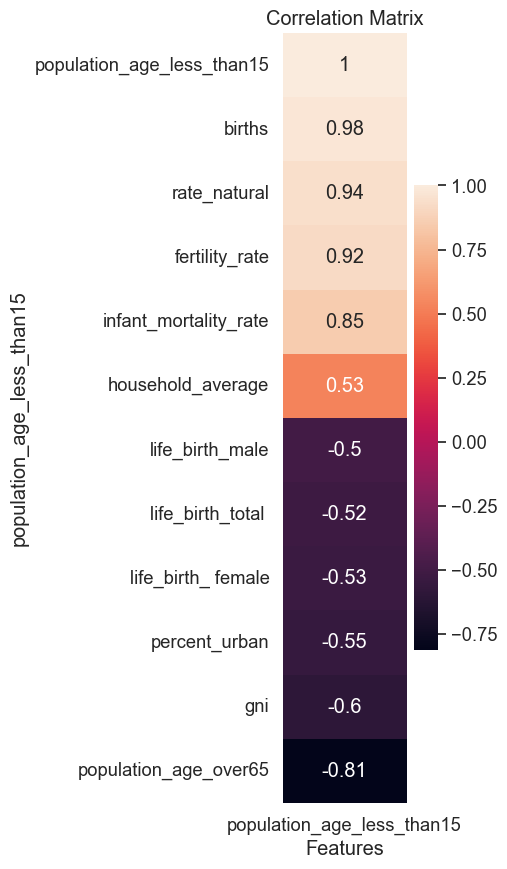

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 213 entries, 0 to 212
Data columns (total 25 columns):
 #   Column                            Non-Null Count  Dtype 
---  ------                            --------------  ----- 
 0   country                           213 non-null    object
 1   population                        213 non-null    int64 
 2   births                            213 non-null    int64 
 3   deaths                            213 non-null    int64 
 4   rate_natural                      213 non-null    int64 
 5   migration_rate                    213 non-null    int64 
 6   population_mid2035                213 non-null    int64 
 7   population_mid2050                213 non-null    int64 
 8   infant_mortality_rate             213 non-null    int64 
 9   fertility_rate                    213 non-null    int64 
 10  population_age_less_than15        213 non-null    int64 
 11  population_age_over65             213 non-null    int64 
 12  family_planning_ all  

population_age_less_than15    1.000000
births                        0.976017
rate_natural                  0.937261
fertility_rate                0.918515
infant_mortality_rate         0.849747
Name: population_age_less_than15, dtype: float64

In [31]:
corr_matrix = df_2020.corr()
age152020_corr = corr_matrix["population_age_less_than15"][(corr_matrix["population_age_less_than15"] > 0.5) | (corr_matrix["population_age_less_than15"] < -0.5)]
age152020_corr = age152020_corr.sort_values(ascending=False)



fig, ax = plt.subplots(figsize=(2,10))



sns.set(font_scale=1.2, font='Arial')
sns.heatmap(age152020_corr.to_frame(),  annot=True, ax=ax)


ax.set_title('Correlation Matrix')
ax.set_xlabel('Features')
ax.set_ylabel('population_age_less_than15')



plt.show()

df_2020.info()
display(age152020_corr.head())

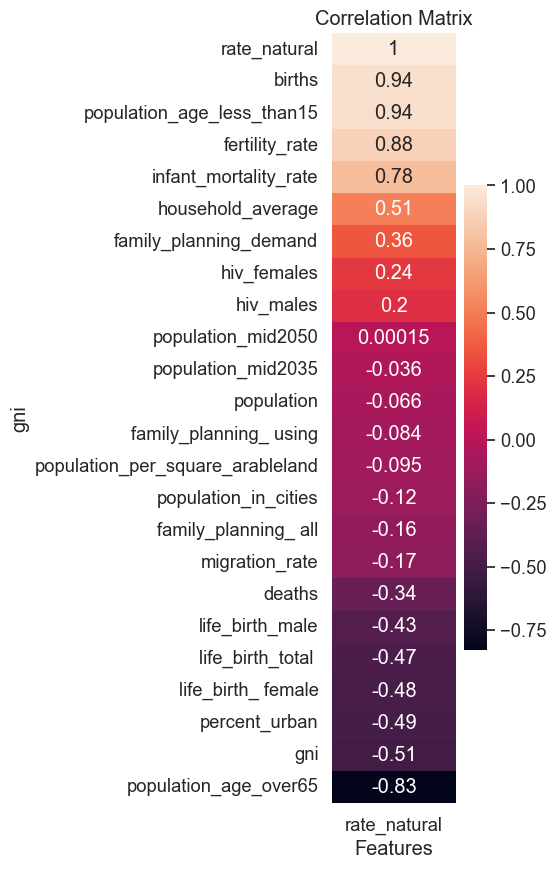

,country,population,births,deaths,rate_natural,migration_rate,population_mid2035,population_mid2050,infant_mortality_rate,fertility_rate,...,life_birth_total,life_birth_male,life_birth_ female,hiv_males,hiv_females,percent_urban,population_in_cities,household_average,population_per_square_arableland,gni
0,Algeria,44,24,5,2,0,53,61,21,3,...,78,77,78,0,0,73,6,0,594,11370
1,Egypt,101,23,6,2,0,129,158,15,3,...,74,73,75,0,0,43,25,4,3617,11350
2,Libya,7,24,4,2,0,8,10,12,3,...,76,74,79,0,0,80,17,0,401,14820
3,Morocco,36,17,5,1,-1,41,44,18,2,...,76,75,78,0,0,63,24,4,460,8430
4,Sudan,44,32,7,3,-1,62,81,42,4,...,65,63,67,0,0,36,13,6,221,4430


rate_natural                  1.000000
births                        0.944063
population_age_less_than15    0.937261
fertility_rate                0.876021
infant_mortality_rate         0.779176
Name: rate_natural, dtype: float64

In [32]:
lbtotal2020_corr = corr_matrix["rate_natural"]#[(corr_matrix["life_birth_total"] > 0.4) | (corr_matrix["life_birth_total"] < -0.4)]
lbtotal2020_corr = lbtotal2020_corr.sort_values(ascending=False)



fig, ax = plt.subplots(figsize=(2,10))



sns.set(font_scale=1.2, font='Arial')
sns.heatmap(lbtotal2020_corr.to_frame(),  annot=True, ax=ax)


ax.set_title('Correlation Matrix')
ax.set_xlabel('Features')
ax.set_ylabel('gni')



plt.show()

display(df_2020.head())
display(lbtotal2020_corr.head())

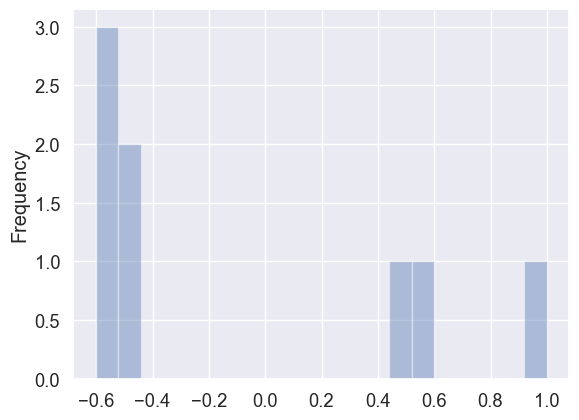

In [33]:

axes = gni2020_corr.plot( kind='hist',
                subplots=False,  
                bins=20,
                alpha=0.4,
          )

In [34]:
#df_2021.info()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\3171853624.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix_2021 = df_2021.corr().round(2)


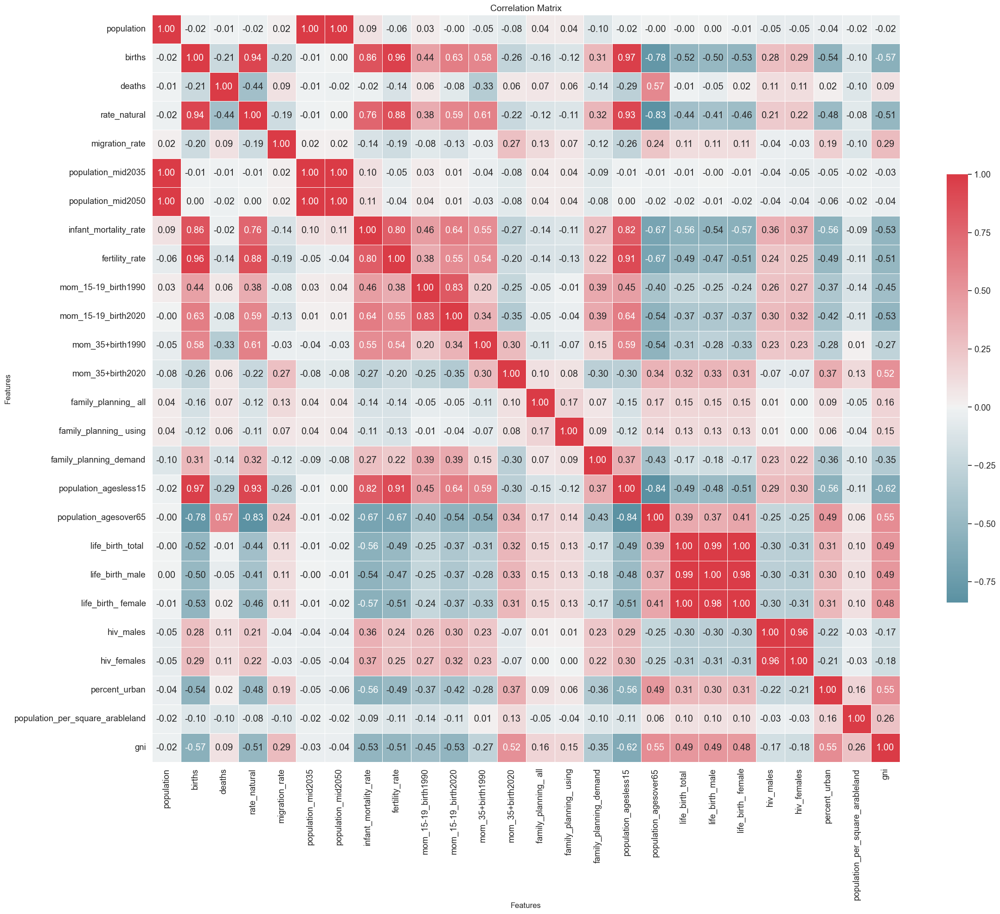

,country,population,births,deaths,rate_natural,migration_rate,population_mid2035,population_mid2050,infant_mortality_rate,fertility_rate,...,population_agesless15,population_agesover65,life_birth_total,life_birth_male,life_birth_ female,hiv_males,hiv_females,percent_urban,population_per_square_arableland,gni
0,Algeria,45,22,5,2,-1,55,58,17,3,...,30,6,78,77,79,0,0,73,601,11010
1,Egypt,102,23,6,2,0,123,143,16,3,...,34,5,75,73,76,0,0,43,3514,12210
2,Libya,7,18,5,1,0,8,9,10,2,...,28,5,73,70,76,0,0,80,404,11250
3,Morocco,36,18,5,1,-1,41,44,18,2,...,27,8,77,76,78,0,0,64,526,7190
4,Sudan,45,31,7,2,-1,62,81,40,4,...,40,4,66,64,68,0,0,36,227,3970


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 0 to 218
Data columns (total 27 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   country                           219 non-null    object 
 1   population                        219 non-null    int64  
 2   births                            219 non-null    int64  
 3   deaths                            219 non-null    int64  
 4   rate_natural                      219 non-null    int64  
 5   migration_rate                    219 non-null    int64  
 6   population_mid2035                219 non-null    int64  
 7   population_mid2050                219 non-null    int64  
 8   infant_mortality_rate             219 non-null    int64  
 9   fertility_rate                    219 non-null    int64  
 10  mom_15-19_birth1990               219 non-null    int64  
 11  mom_15-19_birth2020               219 non-null    int64  
 12  mom_35+b

In [35]:
df_2021 = pd.read_csv('2021.csv')



corr_matrix_2021 = df_2021.corr().round(2)


fig, ax = plt.subplots(figsize=(26, 24))



cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr_matrix_2021, cmap=cmap, annot=True, fmt='.2f', center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})


ax.set_title('Correlation Matrix', fontsize=14)
ax.set_xlabel('Features', fontsize=12)
ax.set_ylabel('Features', fontsize=12)


plt.show()

display(df_2021.head())
df_2021.info()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\1145598992.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix_2021 = df_2021.corr()


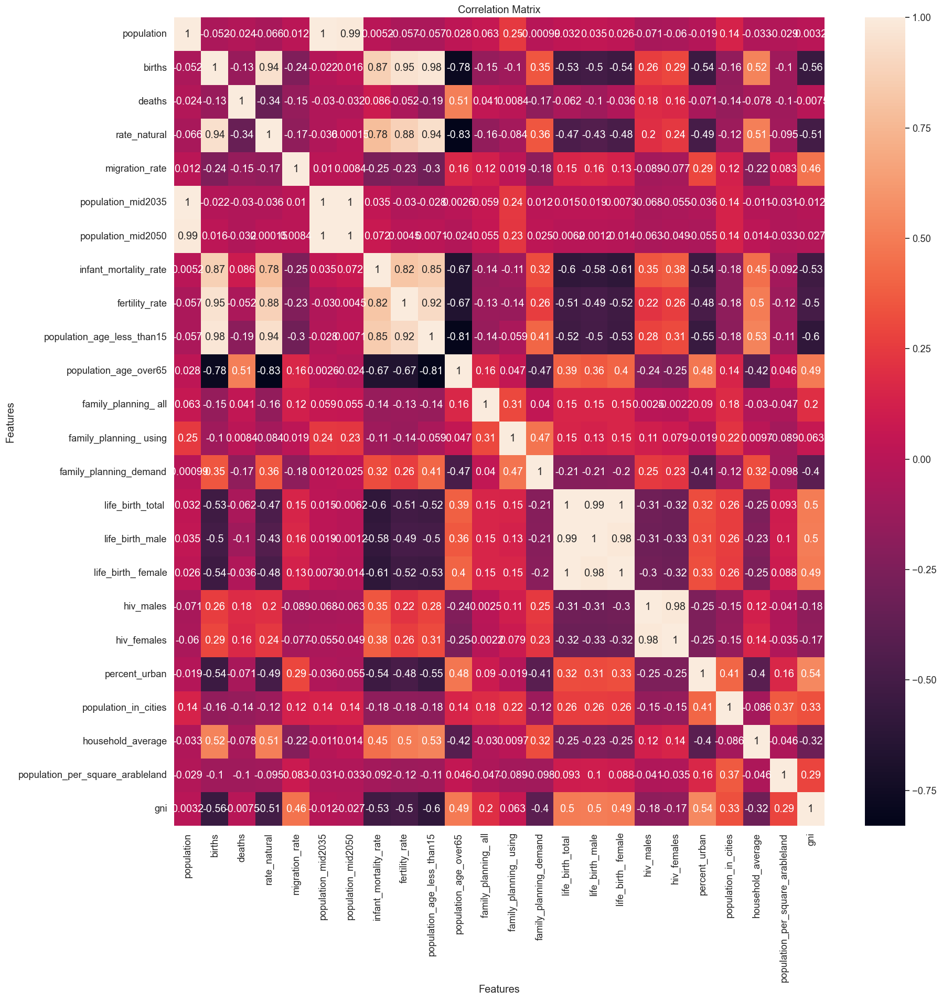

,country,population,births,deaths,rate_natural,migration_rate,population_mid2035,population_mid2050,infant_mortality_rate,fertility_rate,...,population_agesless15,population_agesover65,life_birth_total,life_birth_male,life_birth_ female,hiv_males,hiv_females,percent_urban,population_per_square_arableland,gni
0,Algeria,45,22,5,2,-1,55,58,17,3,...,30,6,78,77,79,0,0,73,601,11010
1,Egypt,102,23,6,2,0,123,143,16,3,...,34,5,75,73,76,0,0,43,3514,12210
2,Libya,7,18,5,1,0,8,9,10,2,...,28,5,73,70,76,0,0,80,404,11250
3,Morocco,36,18,5,1,-1,41,44,18,2,...,27,8,77,76,78,0,0,64,526,7190
4,Sudan,45,31,7,2,-1,62,81,40,4,...,40,4,66,64,68,0,0,36,227,3970


In [36]:
corr_matrix_2021 = df_2021.corr()



fig, ax = plt.subplots(figsize=(20,20))



sns.heatmap(corr_matrix,  annot=True, ax=ax)


ax.set_title('Correlation Matrix')
ax.set_xlabel('Features')
ax.set_ylabel('Features')


plt.show()

display(df_2021.head())

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\1822402147.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix_2021 = df_2021.corr()


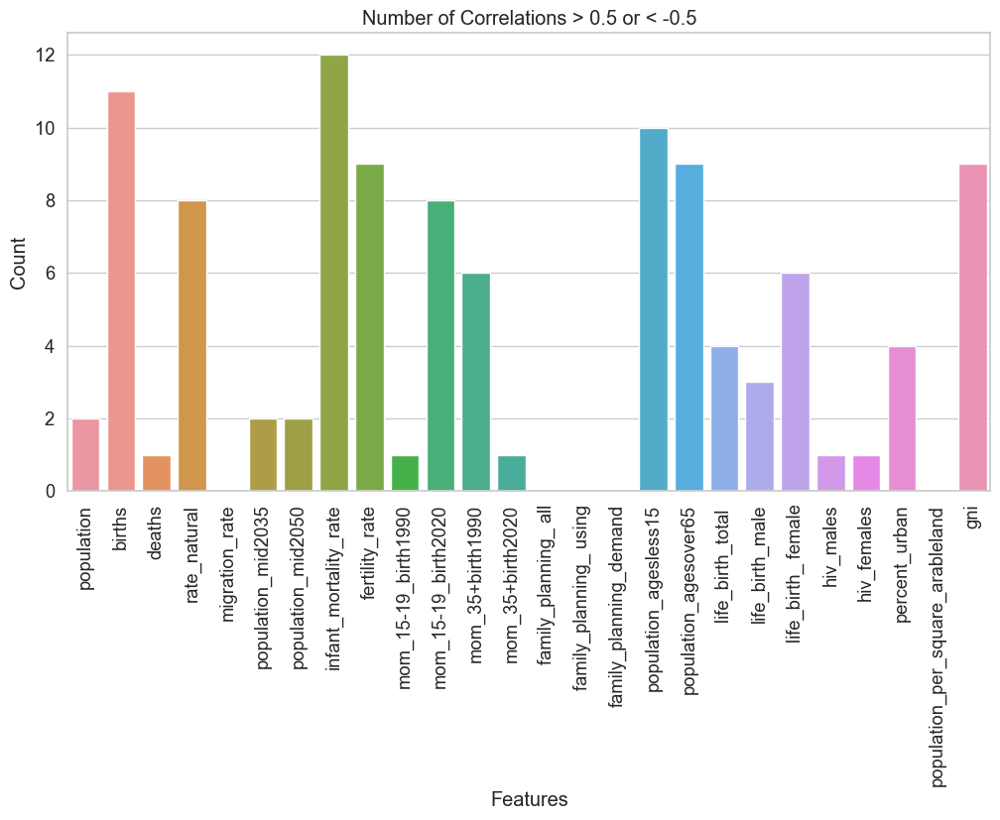

In [37]:
corr_matrix_2021 = df_2021.corr()


count_matrix = corr_matrix_2021.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1


sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x=count_matrix.index, y=count_matrix.values)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Number of Correlations > 0.5 or < -0.5')
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\3588911588.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_bar_2021 = df_2021.corr()


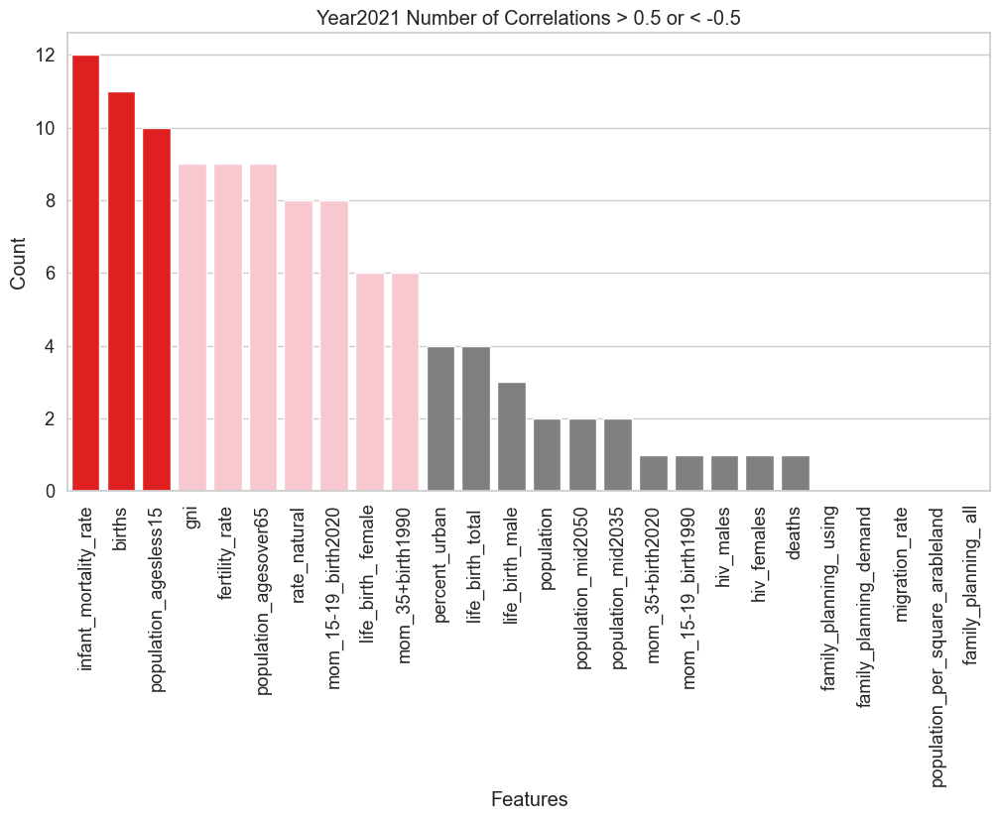

In [38]:
corr_bar_2021 = df_2021.corr()


count_matrix = corr_bar_2021.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1



sorted_count = count_matrix.sort_values(ascending=False)



colors = ['grey']*len(sorted_count)
colors[:3] = ['red']*3
colors[3:10] = ['pink']*7



sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x=sorted_count.index, y=sorted_count.values, palette=colors)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Year2021 Number of Correlations > 0.5 or < -0.5')
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\855618821.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix_2021 = df_2021.corr()


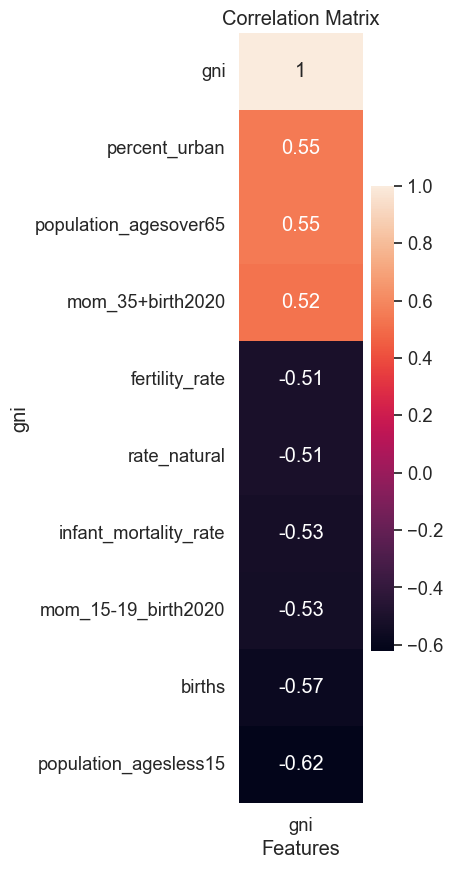

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 0 to 218
Data columns (total 27 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   country                           219 non-null    object 
 1   population                        219 non-null    int64  
 2   births                            219 non-null    int64  
 3   deaths                            219 non-null    int64  
 4   rate_natural                      219 non-null    int64  
 5   migration_rate                    219 non-null    int64  
 6   population_mid2035                219 non-null    int64  
 7   population_mid2050                219 non-null    int64  
 8   infant_mortality_rate             219 non-null    int64  
 9   fertility_rate                    219 non-null    int64  
 10  mom_15-19_birth1990               219 non-null    int64  
 11  mom_15-19_birth2020               219 non-null    int64  
 12  mom_35+b

gni                      1.000000
percent_urban            0.546744
population_agesover65    0.546477
mom_35+birth2020         0.520264
fertility_rate          -0.506729
Name: gni, dtype: float64

In [39]:
corr_matrix_2021 = df_2021.corr()
gni2021_corr = corr_matrix_2021["gni"][(corr_matrix_2021["gni"] > 0.5) | (corr_matrix_2021["gni"] < -0.5)]
gni2021_corr = gni2021_corr.sort_values(ascending=False)



fig, ax = plt.subplots(figsize=(2,10))



sns.set(font_scale=1.2, font='Arial')
sns.heatmap(gni2021_corr.to_frame(),  annot=True, ax=ax)


ax.set_title('Correlation Matrix')
ax.set_xlabel('Features')
ax.set_ylabel('gni')


plt.show()

df_2021.info()
display(gni2021_corr.head())

In [40]:
#df_2022.info()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\4206684709.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix_2022 = df_2022.corr()


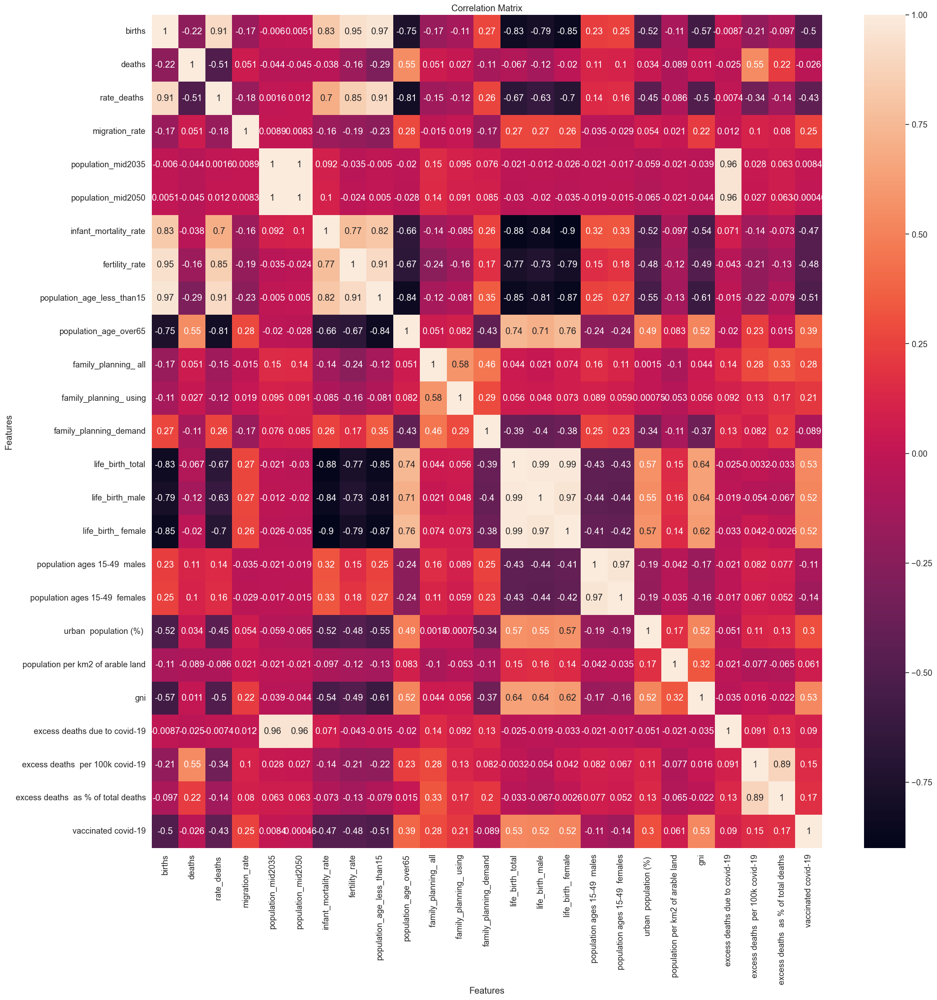

,country,population,births,deaths,rate_deaths,migration_rate,population_mid2035,population_mid2050,infant_mortality_rate,fertility_rate,...,life_birth_ female,population ages 15-49 males,population ages 15-49 females,urban population (%),population per km2 of arable land,gni,excess deaths due to covid-19,excess deaths per 100k covid-19,excess deaths as % of total deaths,vaccinated covid-19
0,Algeria,44.9,22,5,2.0,0.0,52,60,19,3.0,...,78,0.05,0.05,74,598,11750,34794.0,79.0,14.0,16
1,Egypt,103.5,21,7,1.0,1.0,123,145,16,3.0,...,76,0.05,0.05,44,3077,12910,125551.0,122.0,18.0,35
2,Morocco,36.7,17,5,1.0,-1.0,41,44,15,2.0,...,76,0.05,0.05,64,479,8020,17374.0,47.0,6.0,63
3,Sudan,46.9,34,7,3.0,0.0,64,85,39,5.0,...,68,0.00,0.00,36,223,4000,19000.0,43.0,7.0,9
4,Tunisia,11.8,16,8,1.0,-1.0,13,14,14,2.0,...,77,0.05,0.05,70,456,11270,11911.0,100.0,14.0,54


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220 entries, 0 to 219
Data columns (total 27 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   country                              220 non-null    object 
 1   population                           220 non-null    object 
 2   births                               220 non-null    int64  
 3   deaths                               220 non-null    int64  
 4   rate_deaths                          220 non-null    float64
 5   migration_rate                       219 non-null    float64
 6   population_mid2035                   220 non-null    int64  
 7   population_mid2050                   220 non-null    int64  
 8   infant_mortality_rate                220 non-null    int64  
 9   fertility_rate                       220 non-null    float64
 10  population_age_less_than15           220 non-null    int64  
 11  population_age_over65           

In [41]:
df_2022 = pd.read_csv('2022.csv')


corr_matrix_2022 = df_2022.corr()


fig, ax = plt.subplots(figsize=(24,24))


sns.heatmap(corr_matrix_2022,  annot=True, ax=ax)


ax.set_title('Correlation Matrix')
ax.set_xlabel('Features')
ax.set_ylabel('Features')


plt.show()

display(df_2022.head())
df_2022.info()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\1944163464.py:4: FutureWarning: The default value of regex will change from True to False in a future version.
  df_2022[col] = df_2022[col].str.replace(',', '').str.replace(r'[\(\)]', '').str.strip()
C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\1944163464.py:10: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix_2022 = df_2022.corr().round(2)


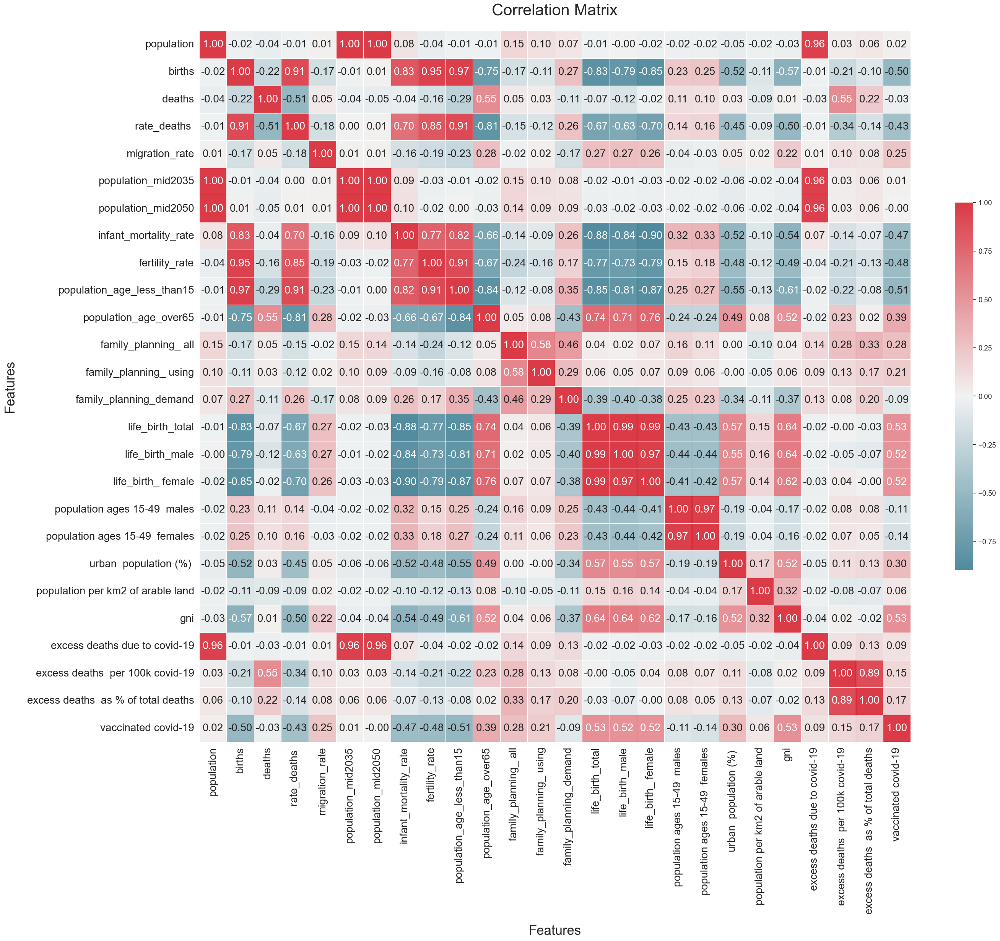

,country,population,births,deaths,rate_deaths,migration_rate,population_mid2035,population_mid2050,infant_mortality_rate,fertility_rate,...,life_birth_ female,population ages 15-49 males,population ages 15-49 females,urban population (%),population per km2 of arable land,gni,excess deaths due to covid-19,excess deaths per 100k covid-19,excess deaths as % of total deaths,vaccinated covid-19
0,Algeria,44.9,22,5,2.0,0.0,52,60,19,3.0,...,78,0.05,0.05,74,598,11750,34794.0,79.0,14.0,16
1,Egypt,103.5,21,7,1.0,1.0,123,145,16,3.0,...,76,0.05,0.05,44,3077,12910,125551.0,122.0,18.0,35
2,Morocco,36.7,17,5,1.0,-1.0,41,44,15,2.0,...,76,0.05,0.05,64,479,8020,17374.0,47.0,6.0,63
3,Sudan,46.9,34,7,3.0,0.0,64,85,39,5.0,...,68,0.00,0.00,36,223,4000,19000.0,43.0,7.0,9
4,Tunisia,11.8,16,8,1.0,-1.0,13,14,14,2.0,...,77,0.05,0.05,70,456,11270,11911.0,100.0,14.0,54


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220 entries, 0 to 219
Data columns (total 27 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   country                              220 non-null    object 
 1   population                           220 non-null    float64
 2   births                               220 non-null    int64  
 3   deaths                               220 non-null    int64  
 4   rate_deaths                          220 non-null    float64
 5   migration_rate                       219 non-null    float64
 6   population_mid2035                   220 non-null    int64  
 7   population_mid2050                   220 non-null    int64  
 8   infant_mortality_rate                220 non-null    int64  
 9   fertility_rate                       220 non-null    float64
 10  population_age_less_than15           220 non-null    int64  
 11  population_age_over65           

In [42]:
df_2022 = pd.read_csv('2022.csv')
cols_to_convert_2022 = ['population']
for col in cols_to_convert_2022:
    df_2022[col] = df_2022[col].str.replace(',', '').str.replace(r'[\(\)]', '').str.strip()
    df_2022.loc[df_2022[col] == '-', col] = np.nan
    df_2022[col] = df_2022[col].astype(float)


    
corr_matrix_2022 = df_2022.corr().round(2)



fig, ax = plt.subplots(figsize=(30, 25))



cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(corr_matrix_2022, cmap=cmap, annot=True, fmt='.2f', center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot_kws={"fontsize": 20})


ax.set_title('Correlation Matrix', fontsize=30, pad=30)
ax.set_xlabel('Features', fontsize=25, labelpad=20)
ax.set_ylabel('Features', fontsize=25, labelpad=20)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xticks(rotation=90)
plt.yticks(rotation=0)


plt.show()

display(df_2022.head())
df_2022.info()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\2631605864.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix_2022 = df_2022.corr()


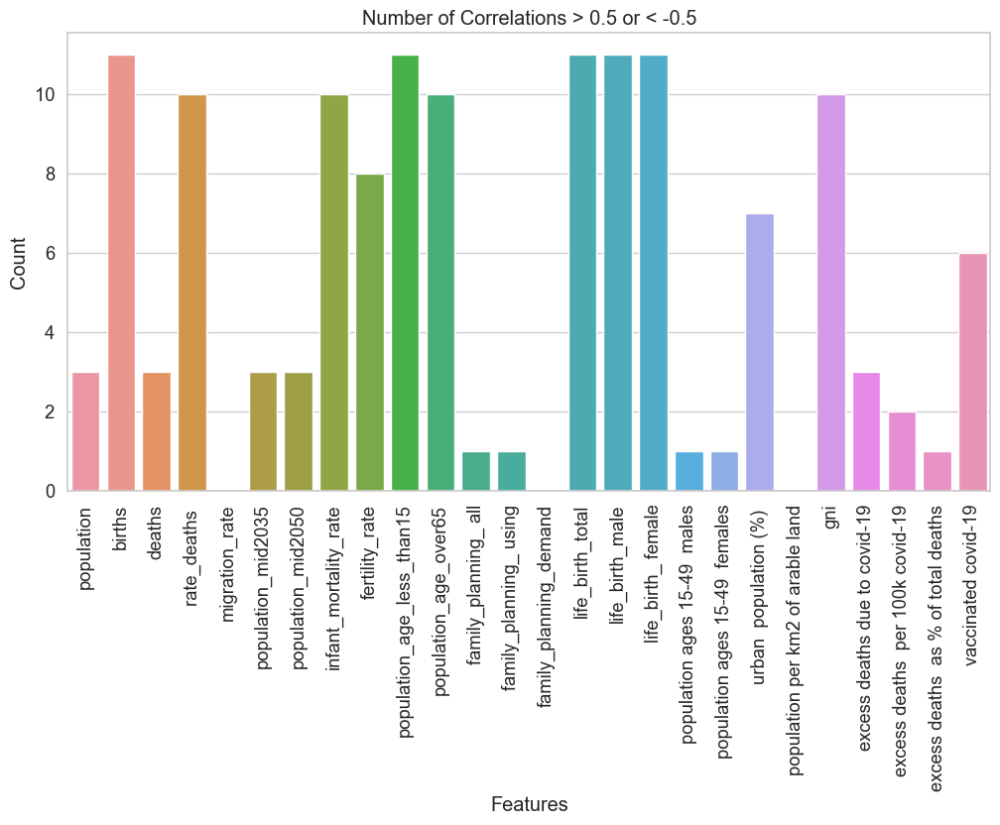

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt


corr_matrix_2022 = df_2022.corr()


count_matrix = corr_matrix_2022.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1


sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x=count_matrix.index, y=count_matrix.values)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Number of Correlations > 0.5 or < -0.5')
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\1167235541.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_bar_2022 = df_2022.corr()


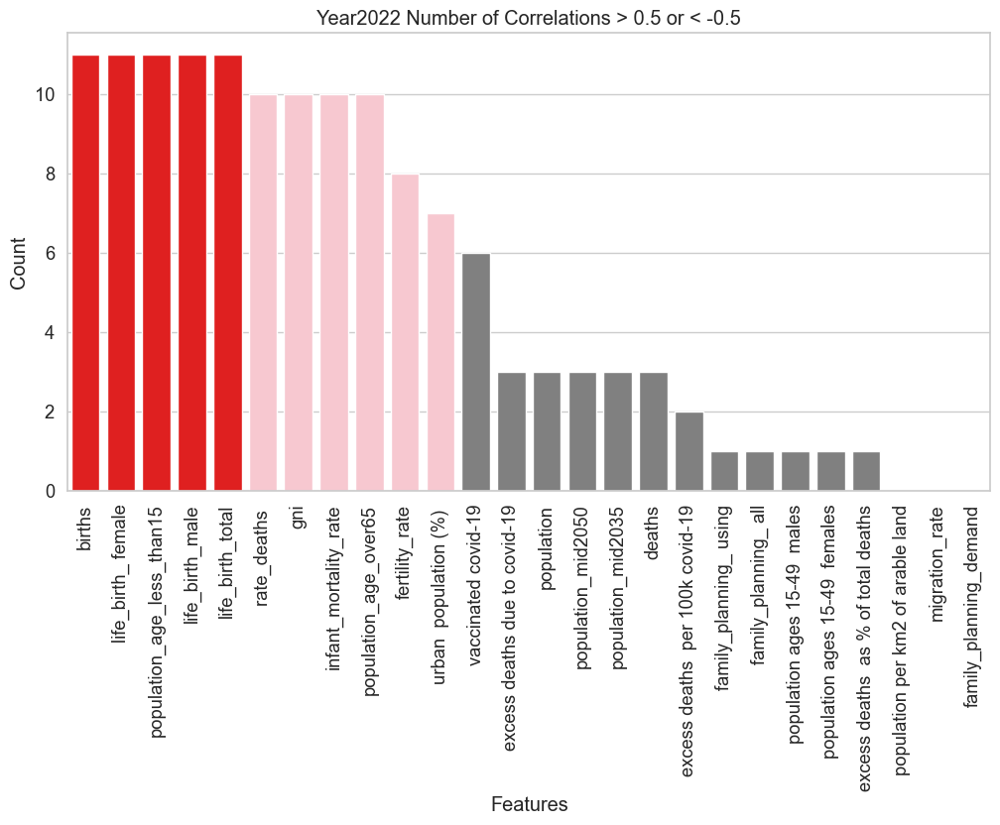

In [44]:
corr_bar_2022 = df_2022.corr()


count_matrix = corr_bar_2022.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1



sorted_count = count_matrix.sort_values(ascending=False)


colors = ['grey']*len(sorted_count)
colors[:5] = ['red']*5
colors[5:11] = ['pink']*6


sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
sns.barplot(x=sorted_count.index, y=sorted_count.values, palette=colors)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Year2022 Number of Correlations > 0.5 or < -0.5')
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\344258658.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix_2022 = df_2022.corr()


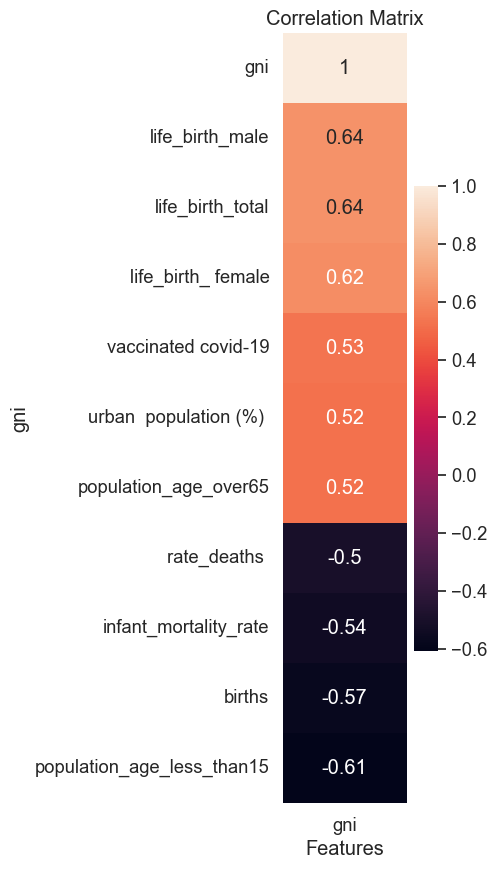

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220 entries, 0 to 219
Data columns (total 27 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   country                              220 non-null    object 
 1   population                           220 non-null    float64
 2   births                               220 non-null    int64  
 3   deaths                               220 non-null    int64  
 4   rate_deaths                          220 non-null    float64
 5   migration_rate                       219 non-null    float64
 6   population_mid2035                   220 non-null    int64  
 7   population_mid2050                   220 non-null    int64  
 8   infant_mortality_rate                220 non-null    int64  
 9   fertility_rate                       220 non-null    float64
 10  population_age_less_than15           220 non-null    int64  
 11  population_age_over65           

gni                    1.000000
life_birth_male        0.641598
life_birth_total       0.636705
life_birth_ female     0.618529
vaccinated covid-19    0.529994
Name: gni, dtype: float64

In [45]:
corr_matrix_2022 = df_2022.corr()
gni2022_corr = corr_matrix_2022["gni"][(corr_matrix_2022["gni"] > 0.5) | (corr_matrix_2022["gni"] < -0.5)]
gni2022_corr = gni2022_corr.sort_values(ascending=False)


fig, ax = plt.subplots(figsize=(2,10))



sns.set(font_scale=1.2, font='Arial')
sns.heatmap(gni2022_corr.to_frame(),  annot=True, ax=ax)


ax.set_title('Correlation Matrix')
ax.set_xlabel('Features')
ax.set_ylabel('gni')


plt.show()

df_2022.info()
display(gni2022_corr.head())

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\3235896133.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix_2022 = df_2022.corr()


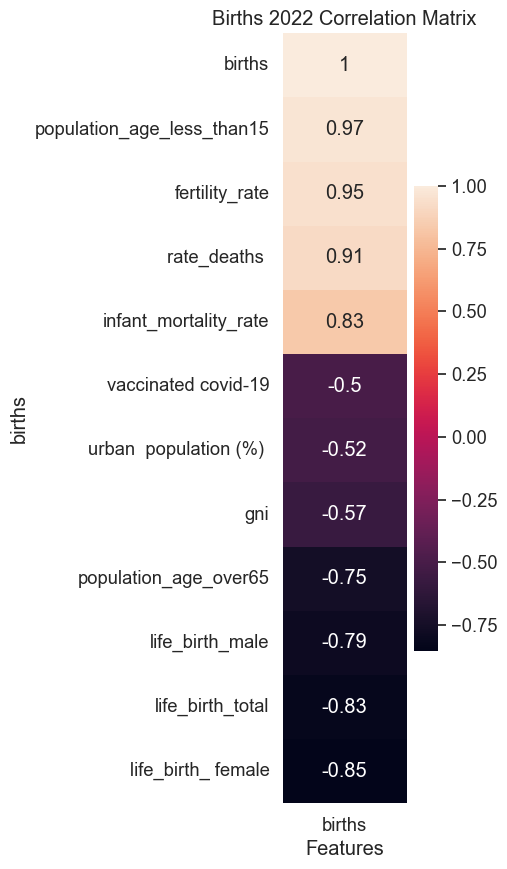

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220 entries, 0 to 219
Data columns (total 27 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   country                              220 non-null    object 
 1   population                           220 non-null    float64
 2   births                               220 non-null    int64  
 3   deaths                               220 non-null    int64  
 4   rate_deaths                          220 non-null    float64
 5   migration_rate                       219 non-null    float64
 6   population_mid2035                   220 non-null    int64  
 7   population_mid2050                   220 non-null    int64  
 8   infant_mortality_rate                220 non-null    int64  
 9   fertility_rate                       220 non-null    float64
 10  population_age_less_than15           220 non-null    int64  
 11  population_age_over65           

births                        1.000000
population_age_less_than15    0.967598
fertility_rate                0.945896
rate_deaths                   0.914070
infant_mortality_rate         0.832419
Name: births, dtype: float64

In [46]:
corr_matrix_2022 = df_2022.corr()
births2022_corr = corr_matrix_2022["births"][(corr_matrix_2022["births"] > 0.5) | (corr_matrix_2022["births"] < -0.5)]
births2022_corr = births2022_corr.sort_values(ascending=False)


fig, ax = plt.subplots(figsize=(2,10))



sns.set(font_scale=1.2, font='Arial')
sns.heatmap(births2022_corr.to_frame(),  annot=True, ax=ax)


ax.set_title('Births 2022 Correlation Matrix')
ax.set_xlabel('Features')
ax.set_ylabel('births')


plt.show()

df_2022.info()
display(births2022_corr.head())

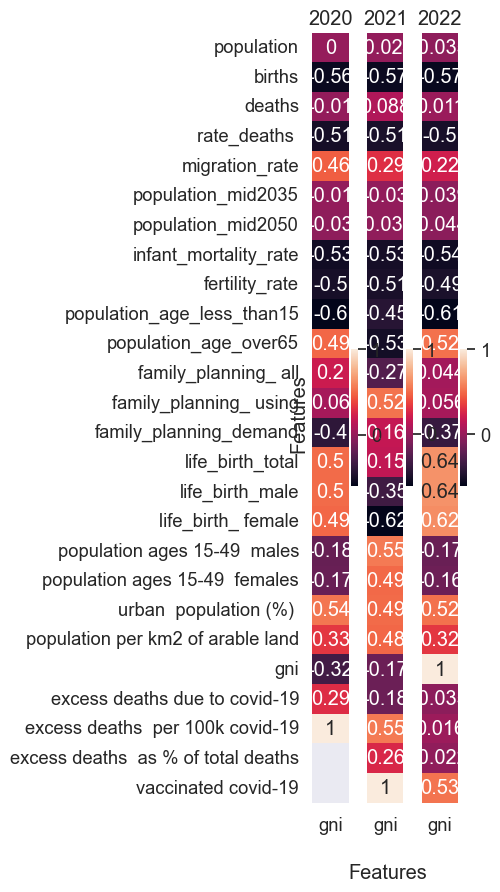

In [47]:
gni_matrix_2020 = corr_matrix_2020
gni_matrix_2020 = gni_matrix_2020["gni"][(corr_matrix_2020["gni"] > 0.5) | (corr_matrix_2020["gni"] < -0.5)]

gni_matrix_2021 = corr_matrix_2021
gni_matrix_2021 = gni_matrix_2021["gni"][(corr_matrix_2021["gni"] > 0.5) | (corr_matrix_2021["gni"] < -0.5)]

gni_matrix_2022 = corr_matrix_2022
gni_matrix_2022 = gni_matrix_2022["gni"][(corr_matrix_2022["gni"] > 0.5) | (corr_matrix_2022["gni"] < -0.5)]


columns = ["gni"]


fig, axs = plt.subplots(1, 3, figsize=(2, 10), sharex=True, sharey=True, gridspec_kw={'hspace': 0.8})


sns.heatmap(corr_matrix_2020[columns], annot=True, ax=axs[0])
axs[0].set_title('2020')

sns.heatmap(corr_matrix_2021[columns], annot=True, ax=axs[1])
axs[1].set_title('2021')

sns.heatmap(corr_matrix_2022[columns], annot=True, ax=axs[2])
axs[2].set_title('2022')


fig.text(0.5, 0.04, 'Features', ha='center', va='center')
fig.text(0.06, 0.5, 'Features', ha='center', va='center', rotation='vertical')


plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\1430543765.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_bar_2020 = df_2020.corr()
C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\1430543765.py:18: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_bar_2021 = df_2021.corr()
C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\1430543765.py:34: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_bar_2022 = df_2022.corr()


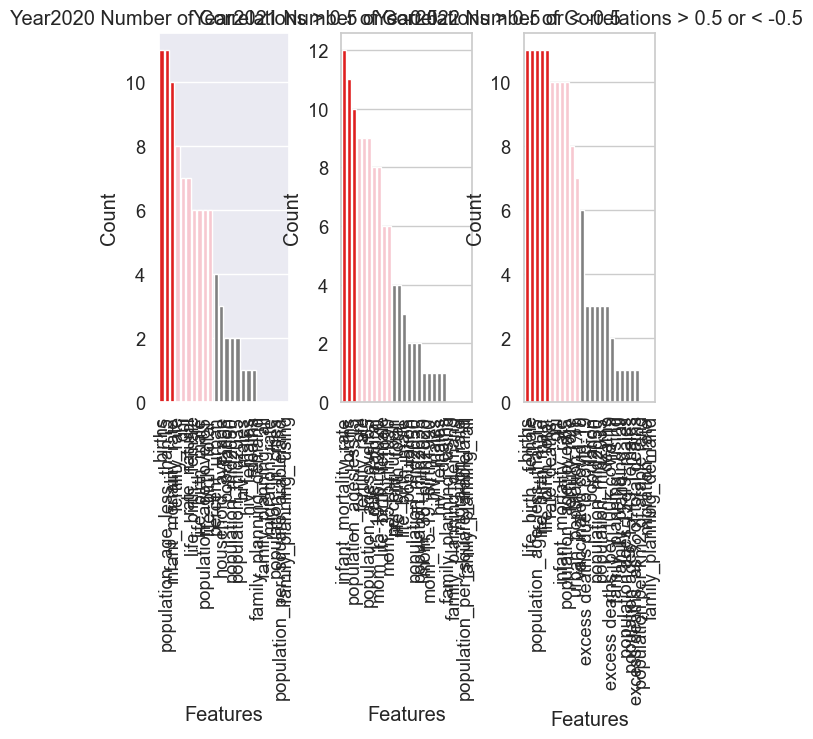

In [48]:
plt.subplot(1, 3, 1)
corr_bar_2020 = df_2020.corr()
count_matrix = corr_bar_2020.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1
sorted_count = count_matrix.sort_values(ascending=False)
colors = ['grey']*len(sorted_count)
colors[:3] = ['red']*3
colors[3:10] = ['pink']*7
sns.set_style("whitegrid")
sns.barplot(x=sorted_count.index, y=sorted_count.values, palette=colors)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Year2020 Number of Correlations > 0.5 or < -0.5')


plt.subplot(1, 3, 2)
corr_bar_2021 = df_2021.corr()
count_matrix = corr_bar_2021.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1
sorted_count = count_matrix.sort_values(ascending=False)
colors = ['grey']*len(sorted_count)
colors[:3] = ['red']*3
colors[3:10] = ['pink']*7
sns.set_style("whitegrid")
sns.barplot(x=sorted_count.index, y=sorted_count.values, palette=colors)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Year2021 Number of Correlations > 0.5 or < -0.5')


plt.subplot(1, 3, 3)
corr_bar_2022 = df_2022.corr()
count_matrix = corr_bar_2022.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1
sorted_count = count_matrix.sort_values(ascending=False)
colors = ['grey']*len(sorted_count)
colors[:5] = ['red']*5
colors[5:11] = ['pink']*6
sns.set_style("whitegrid")
sns.barplot(x=sorted_count.index, y=sorted_count.values, palette=colors)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Year2022 Number of Correlations > 0.5 or < -0.5')


plt.subplots_adjust(wspace=0.4)


plt.show()


C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\773724761.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_bar_2020 = df_2020.corr()
C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\773724761.py:18: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_bar_2021 = df_2021.corr()
C:\Users\Admin\AppData\Local\Temp\ipykernel_14972\773724761.py:34: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_bar_2022 = df_2022.corr()


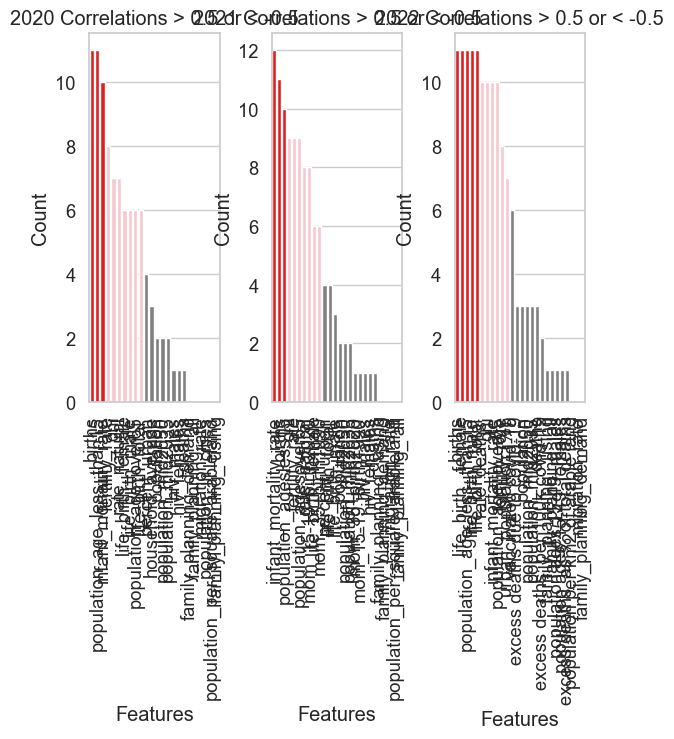

In [49]:
plt.subplot(1, 3, 1)
corr_bar_2020 = df_2020.corr()
count_matrix = corr_bar_2020.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1
sorted_count = count_matrix.sort_values(ascending=False)
colors = ['grey']*len(sorted_count)
colors[:3] = ['red']*3
colors[3:10] = ['pink']*7
sns.set_style("whitegrid")
sns.barplot(x=sorted_count.index, y=sorted_count.values, palette=colors)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('2020 Correlations > 0.5 or < -0.5')


plt.subplot(1, 3, 2)
corr_bar_2021 = df_2021.corr()
count_matrix = corr_bar_2021.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1
sorted_count = count_matrix.sort_values(ascending=False)
colors = ['grey']*len(sorted_count)
colors[:3] = ['red']*3
colors[3:10] = ['pink']*7
sns.set_style("whitegrid")
sns.barplot(x=sorted_count.index, y=sorted_count.values, palette=colors)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('2021 Correlations > 0.5 or < -0.5')


plt.subplot(1, 3, 3)
corr_bar_2022 = df_2022.corr()
count_matrix = corr_bar_2022.applymap(lambda x: 1 if abs(x) > 0.5 else 0).sum()
count_matrix -= 1
sorted_count = count_matrix.sort_values(ascending=False)
colors = ['grey']*len(sorted_count)
colors[:5] = ['red']*5
colors[5:11] = ['pink']*6
sns.set_style("whitegrid")
sns.barplot(x=sorted_count.index, y=sorted_count.values, palette=colors)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('2022 Correlations > 0.5 or < -0.5')


plt.subplots_adjust(wspace=0.4)


plt.show()
